In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from scipy.stats import chi2_contingency
import matplotlib.pyplot as plt
from scipy.stats import pointbiserialr
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
from mpl_toolkits.mplot3d import Axes3D
from dataclasses import dataclass
from sklearn.model_selection import train_test_split
from scipy import optimize
from sklearn import svm
from scipy.optimize import Bounds
from sklearn.metrics import precision_score, recall_score, f1_score as sklearn_f1_score
import h5py
import tensorflow as tf
from tensorflow.python.framework import ops
from sklearn.metrics import confusion_matrix
np.random.seed(1)

## EDA

In [125]:
df=pd.read_csv('online_shoppers_intention 2.csv')
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [ ]:
# Pairplot takes around 6m 30s to run

CPU times: user 3 µs, sys: 2 µs, total: 5 µs
Wall time: 11.4 µs


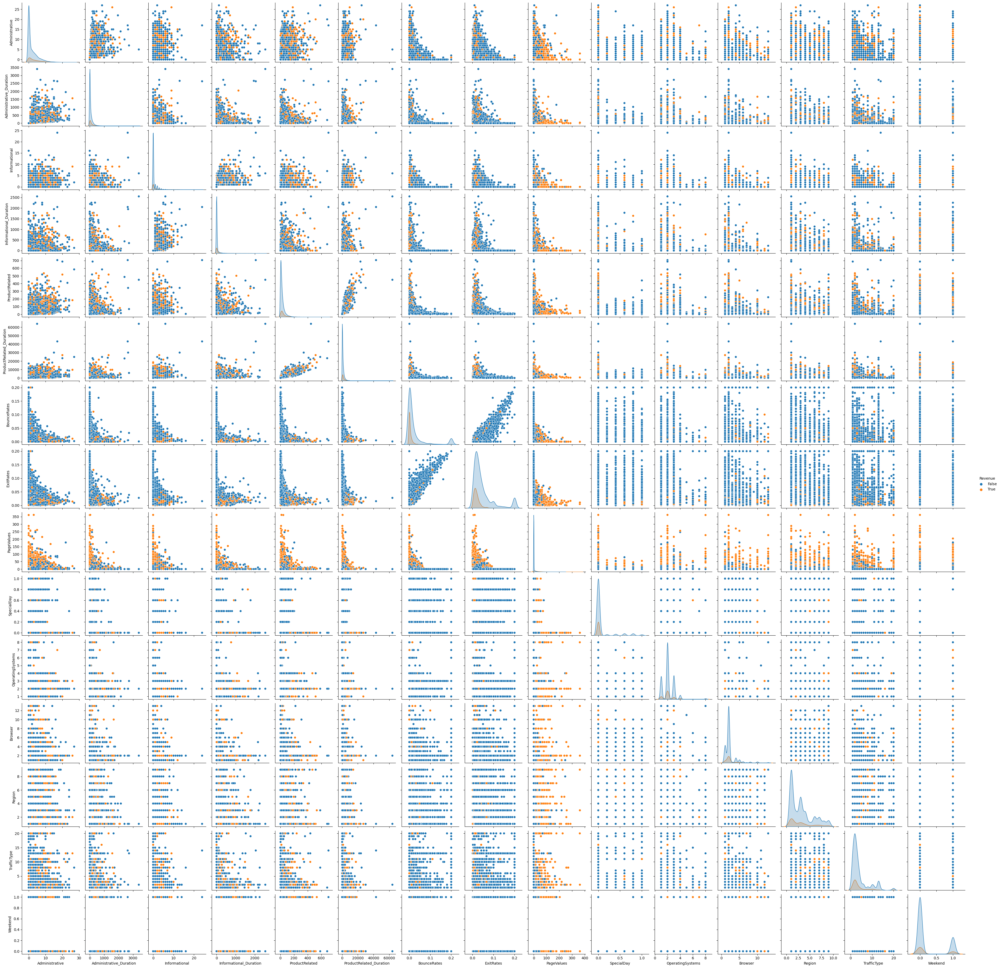

In [ ]:
%time
import seaborn as sns
sns.pairplot(df,hue='Revenue')

In [ ]:
categorical_columns=['Month',
 'OperatingSystems',
 'Browser',
 'Region',
 'TrafficType',
 'VisitorType',
 'Weekend']
numeric_columns=['Administrative',
 'Administrative_Duration',
 'Informational',
 'Informational_Duration',
 'ProductRelated',
 'ProductRelated_Duration',
 'BounceRates',
 'ExitRates',
 'PageValues',
 'SpecialDay']

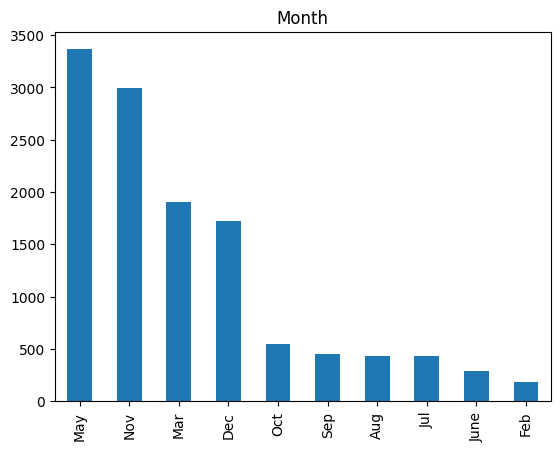

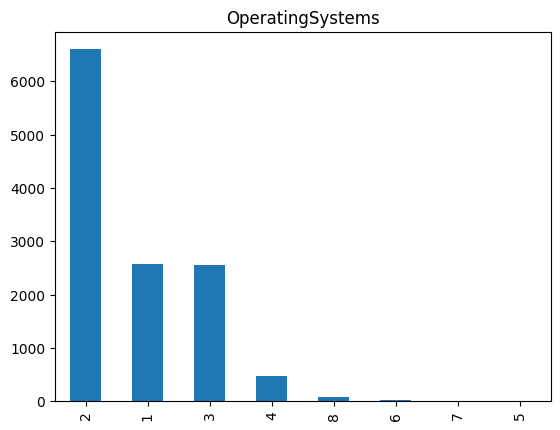

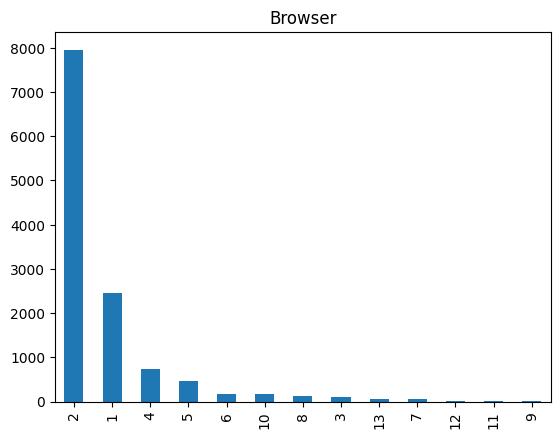

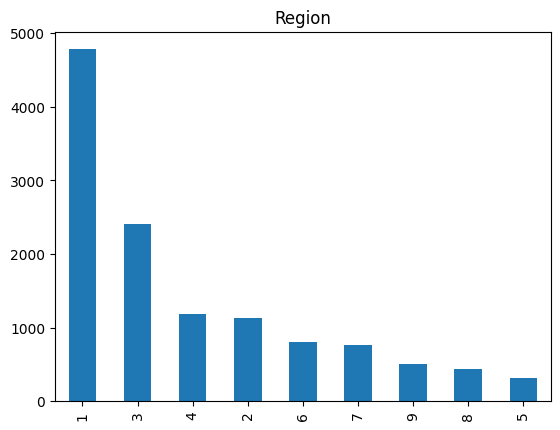

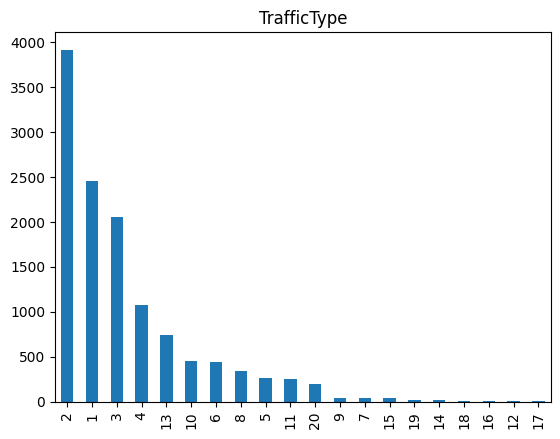

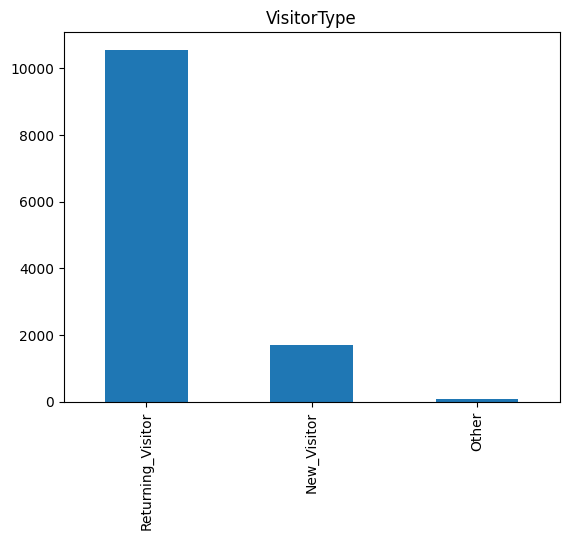

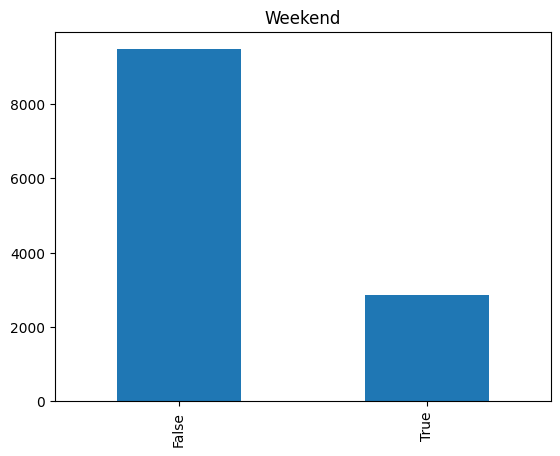

In [ ]:
for i in categorical_columns:
  ax = df[i].value_counts().plot(kind='bar')
  plt.title(i)
  plt.show()

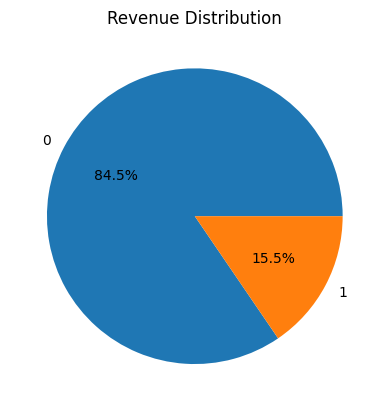

In [ ]:
# Get the unique values and their counts from the 'Revenue' column
revenue_counts = df['Revenue'].value_counts()

# Create a pie chart
plt.pie(revenue_counts, labels=revenue_counts.index, autopct='%1.1f%%')
plt.title('Revenue Distribution')
plt.show()

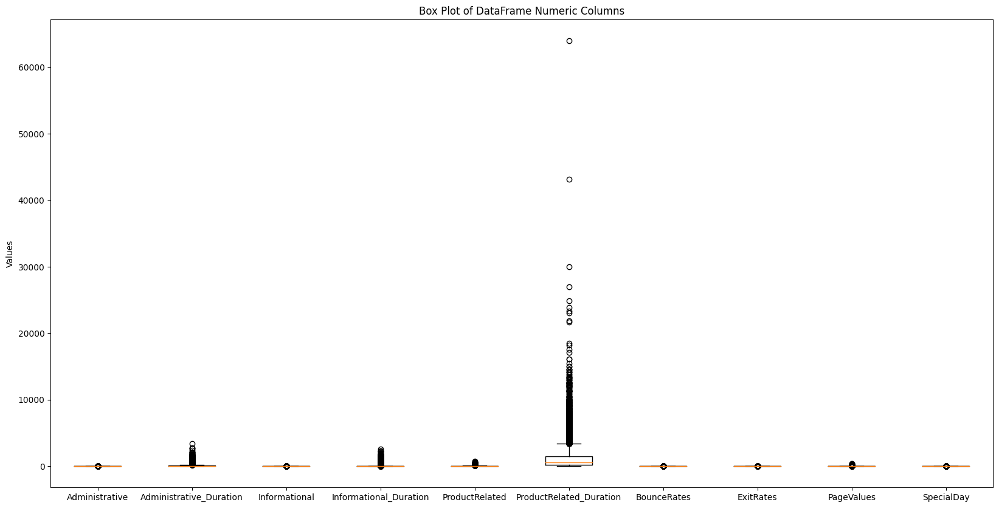

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))
ax.boxplot(df[numeric_columns].values)
ax.set_xticklabels(numeric_columns)
ax.set_ylabel('Values')
ax.set_title('Box Plot of DataFrame Numeric Columns')
plt.show()

## STATISTICAL TESTS

### FINDING THE CORRELATION BETWEEN INPUT AND TARGET VARIBALES

CHI SQUARE CATEGORICAL INPUT VARIABLE VS CATEGORICAL TARGET VARIABLE

In [ ]:
for column in categorical_columns:
  contigency= pd.crosstab(df[column],df['Revenue'])
  contigency_pct = pd.crosstab(df[column],df['Revenue'], normalize='index')
  c, p, dof, expected = chi2_contingency(contigency)
  if(p>0.05):
    print(column," ",p)


Region   0.3214249979076556


POINT BISERIAL TEST NUMERIC INPUT VARIABLE VS CATEGORICAL TARGET VARIABLE

In [ ]:
for column in numeric_columns:
  correlation_coefficient, p = pointbiserialr(df[column], df['Revenue'])
  print(column," ",p)

Administrative   3.5197598377762157e-54
Administrative_Duration   2.1465136347441086e-25
Informational   3.1740343112637484e-26
Informational_Duration   5.2828708607212055e-15
ProductRelated   3.241187328923241e-70
ProductRelated_Duration   6.115338253466188e-65
BounceRates   1.5941975385171387e-63
ExitRates   1.6626536250725168e-119
PageValues   0.0
SpecialDay   5.498934260228583e-20


### FINDING THE CORRELATION BETWEEN INPUT VARIBALES

CHI SQUARE CATEGORICAL INPUT VARIABLE VS CATEGORICAL INPUT VARIABLE

In [ ]:
for i in range(len(categorical_columns)):
    for j in range(i+1, len(categorical_columns)):
        col1 = categorical_columns[i]
        col2 = categorical_columns[j]
        contingency = pd.crosstab(df[col1], df[col2])
        contingency_pct = pd.crosstab(df[col1], df[col2], normalize='index')
        c, p, dof, expected = chi2_contingency(contingency)
        print(col1, col2, p)

Month OperatingSystems 2.485499077759046e-40
Month Browser 5.465866039834048e-61
Month Region 8.133921799065058e-15
Month TrafficType 0.0
Month VisitorType 1.6149400113281784e-91
Month Weekend 8.068340171374844e-08
OperatingSystems Browser 0.0
OperatingSystems Region 7.29937210003443e-216
OperatingSystems TrafficType 0.0
OperatingSystems VisitorType 0.0
OperatingSystems Weekend 3.7508576266269806e-35
Browser Region 7.698462199597579e-284
Browser TrafficType 0.0
Browser VisitorType 0.0
Browser Weekend 2.0550358006762103e-15
Region TrafficType 3.515573427255576e-84
Region VisitorType 8.066996998771664e-164
Region Weekend 0.16565664103884867
TrafficType VisitorType 0.0
TrafficType Weekend 1.786661929082849e-50
VisitorType Weekend 7.582191815913067e-09


ANOVA
NUMERIC INPUT VARIABLE VS CATEGORICAL INPUT VARIABLE

In [ ]:
result_df = pd.DataFrame(columns=['Numerical Variable', 'Categorical Variable', 'F-value', 'p-value'])

for num_var in numeric_columns:
    for cat_var in categorical_columns:
        groups = df.groupby(cat_var)[num_var]
        fvalue, pvalue = stats.f_oneway(*[group for name, group in groups])
        result_df = result_df.append({'Numerical Variable': num_var, 'Categorical Variable': cat_var, 'F-value': fvalue, 'p-value': pvalue}, ignore_index=True)


In [ ]:
filtered_df = result_df[result_df['p-value'] <= 0.05]
print(filtered_df)

         Numerical Variable Categorical Variable     F-value        p-value
0            Administrative                Month   35.965658   1.801736e-63
2            Administrative              Browser    3.923252   4.646171e-06
4            Administrative          TrafficType   15.250625   1.104412e-49
5            Administrative          VisitorType    7.524799   5.420193e-04
6            Administrative              Weekend    8.609037   3.351156e-03
7   Administrative_Duration                Month   12.856847   1.277378e-20
8   Administrative_Duration     OperatingSystems    3.279166   1.747883e-03
11  Administrative_Duration          TrafficType    9.586068   2.033226e-28
12  Administrative_Duration          VisitorType    4.235152   1.449868e-02
14            Informational                Month    9.104522   7.446355e-14
15            Informational     OperatingSystems    2.033281   4.727755e-02
16            Informational              Browser    3.400342   5.388072e-05
17          

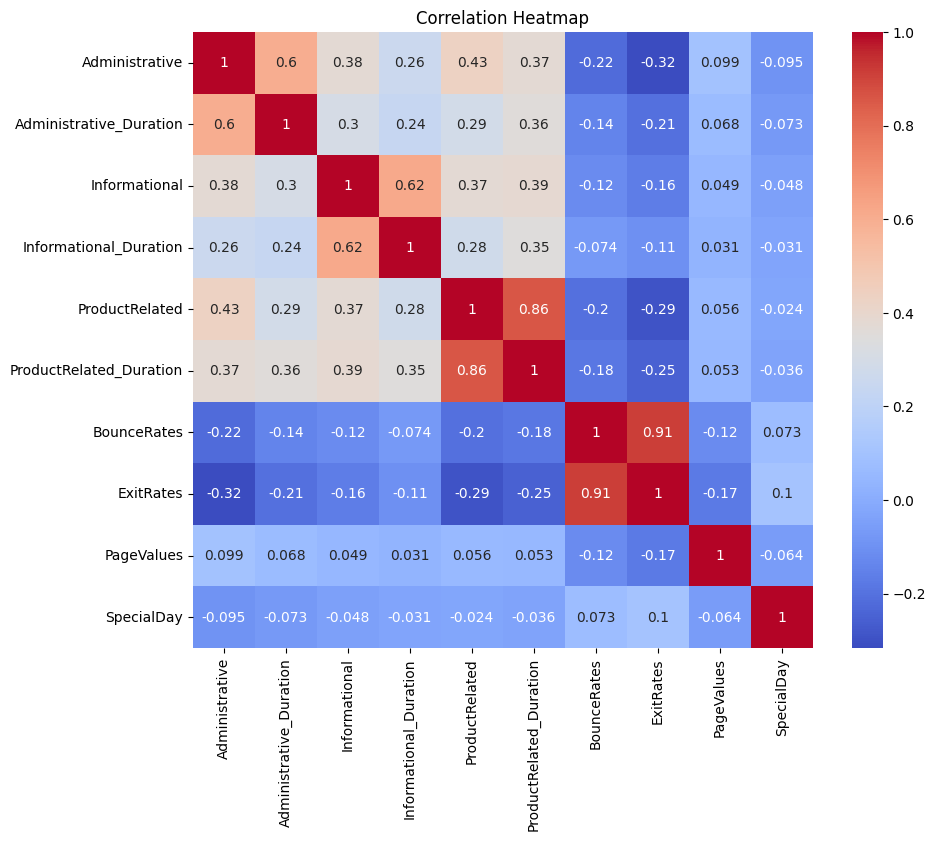

In [ ]:
correlation_matrix = df[numeric_columns].corr()

# Plotting the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [128]:
encoder = LabelEncoder()
df['Month'] = encoder.fit_transform(df['Month'])
df['VisitorType'] = encoder.fit_transform(df['VisitorType'])
df['Weekend'] = encoder.fit_transform(df['Weekend'])
df['Revenue'] = encoder.fit_transform(df['Revenue'])
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,2,1,1,1,1,2,0,0
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,2,2,2,1,2,2,0,0
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,2,4,1,9,3,2,0,0
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,2,3,2,2,4,2,0,0
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,2,3,3,1,4,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,1,4,6,1,1,2,1,0
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,7,3,2,1,8,2,1,0
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,7,3,2,1,13,2,1,0
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,7,2,2,3,11,2,0,0


In [129]:
df=df.drop('Region',axis=1)
df=df.drop('Administrative',axis=1)
df=df.drop('ExitRates',axis=1)
df=df.drop('Informational',axis=1)
df=df.drop('ProductRelated',axis=1)
df

,Administrative_Duration,Informational_Duration,ProductRelated_Duration,BounceRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,TrafficType,VisitorType,Weekend,Revenue
0,0.0,0.0,0.000000,0.200000,0.000000,0.0,2,1,1,1,2,0,0
1,0.0,0.0,64.000000,0.000000,0.000000,0.0,2,2,2,2,2,0,0
2,0.0,0.0,0.000000,0.200000,0.000000,0.0,2,4,1,3,2,0,0
3,0.0,0.0,2.666667,0.050000,0.000000,0.0,2,3,2,4,2,0,0
4,0.0,0.0,627.500000,0.020000,0.000000,0.0,2,3,3,4,2,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,145.0,0.0,1783.791667,0.007143,12.241717,0.0,1,4,6,1,2,1,0
12326,0.0,0.0,465.750000,0.000000,0.000000,0.0,7,3,2,8,2,1,0
12327,0.0,0.0,184.250000,0.083333,0.000000,0.0,7,3,2,13,2,1,0
12328,75.0,0.0,346.000000,0.000000,0.000000,0.0,7,2,2,11,2,0,0


In [130]:
X=df.drop('Revenue',axis=1)
y=df['Revenue']

In [131]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X, y)

In [132]:
X_resampled.shape

(20844, 12)

## LOG LOSS FUNCTION

In [ ]:
@dataclass
class LogisticRegression:

    X:np.matrix
    y:np.array
    learning_rate :np.float32
    epsilon: np.float32
    max_iteration:int


    def __post_init__(self):
      self.X_train,self.X_test,self.y_train,self.y_test = self.split_data()
      self.X_train,mean,std=self.normalize_train_data(self.X_train)
      self.X_test=self.normalize_test_data(self.X_test,mean,std)

    def split_data(self):
      X_train,X_test,y_train,y_test=train_test_split(self.X
                                                     ,self.y
                                                     ,test_size=0.3
                                                     ,shuffle=True,
                                                     stratify=self.y)

      return X_train.values,X_test.values,y_train.values,y_test.values

    def normalize_train_data(self,X):
      X_numeric=X[:, :8]
      X_categorical=X[:, -6:]
      mean=np.mean(X_numeric,axis=0)
      std=np.std(X_numeric,axis=0)
      X_norm =(X_numeric-mean)/std
      X_norm = np.concatenate((X_norm, X_categorical), axis=1)
      return X_norm, mean, std

    def normalize_test_data(self,X,mean,std):
      X_numeric=X[:, :8]
      X_categorical=X[:, -6:]
      X_norm =(X_numeric-mean)/std
      X_norm = np.concatenate((X_norm, X_categorical), axis=1)
      return X_norm

    def sigmoid(self, X):
      z = X.dot(self.w)
      sig = 1 / (1 + np.exp(-z))
      #sig = np.clip(sig, 1e-8, 1 - 1e-8)  # Add epsilon adjustment
      return sig


    def predict(self,X):
      sig = self.sigmoid(X)
      return np.around(sig)

    def cost_function(self,X,y):
      sig=self.sigmoid(X)
      cost=y*(np.log(sig))+(1-y)*np.log(1-sig)
      cost = -cost.sum()/len(y)
      return cost

    def cost_derivative(self,X,y):
      sig=self.sigmoid(X)
      return ((sig-y).dot(X))

    def newton_update(self, X, y):
        sig = self.sigmoid(X)
        gradient = self.cost_derivative(X, y)
        hessian = np.dot(X.T * sig * (1 - sig), X)
        h_inv = np.linalg.inv(hessian)
        self.w -= np.dot(h_inv, gradient)

    def newton_gradient_descent(self, X, y):
        errors = []
        previous_error = float('inf')
        for i in tqdm(range(self.max_iteration), colour='red'):
            self.newton_update(X, y)
            current_error = self.cost_function(X, y)
            errors.append(current_error)
            if np.absolute(previous_error - current_error) < self.epsilon:
                print('MODEL STOPPED LEARNING')
                break
            previous_error = current_error
        self.plot_cost(errors)

    def plot_confusion_matrix(self, y_true, y_pred):
        cm = confusion_matrix(y_true, y_pred)
        classes = np.unique(y_true)
        plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
        plt.title('Confusion Matrix')
        plt.colorbar()
        tick_marks = np.arange(len(classes))
        plt.xticks(tick_marks, classes)
        plt.yticks(tick_marks, classes)

        thresh = cm.max() / 2
        for i in range(cm.shape[0]):
            for j in range(cm.shape[1]):
                plt.text(j, i, cm[i, j], ha='center', va='center',
                         color='white' if cm[i, j] > thresh else 'black')

        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.show()

    def gradient_descent(self,X,y):
      errors=[]
      previous_error = float('inf')
      for i in tqdm(range(self.max_iteration),colour='red'):
        self.w=self.w-(self.learning_rate * self.cost_derivative(X,y))
        current_error=self.cost_function(X,y)
        errors.append(current_error)
        if(np.absolute(previous_error-current_error)<self.epsilon):
          print('MODEL STOPPED LEARNING')
          break
        previous_error=current_error
      self.plot_cost(errors)


    def efficacy_report(self, y_hat, y):
      y_hat = y_hat == 1
      y = y == 1
      tp = (y_hat & y).sum()
      fn = y.sum() - tp
      recall = tp / (tp + fn)
      precision = tp / y_hat.sum()
      correct=np.sum(y_hat==y)
      accuracy = correct / len(y)
      f1_score = 2 * precision * recall / (precision + recall)
      return recall, precision, f1_score, accuracy


    def fit(self):
      self.w = np.ones(self.X_train.shape[1],dtype=np.float64)*0
      self.gradient_descent(self.X_train,self.y_train)
      print('TEST DATA')
      y_hat_test=self.predict(self.X_test)
      recall,precision,f1_score,accuracy=self.efficacy_report(y_hat_test,self.y_test)
      print('RECALL {}'.format(recall))
      print('PRECISION {}'.format(precision))
      print('F1 SCORE {}'.format(f1_score))
      print('ACCURACY SCORE {}'.format(accuracy))
      self.plot_confusion_matrix(self.y_test, y_hat_test)


    def plot_cost(self,cost_sequence):

      s = np.array(cost_sequence)
      t = np.arange(s.size)

      fig, ax = plt.subplots()
      ax.plot(t,s)

      ax.set(xlabel = 'iterations', ylabel = 'cost' , title = 'cost trend')
      ax.grid()
      plt.legend(bbox_to_anchor=(1.05,1), loc=2,shadow=True)
      plt.show()



    def plot(self):
        plt.figure(figsize=(12, 8))
        ax = plt.axes(projection='3d')

        # Data for three-dimensional scattered points
        ax.scatter3D(self.X_train[:, 0], self.X_train[:, 1],
                     self.sigmoid(self.X_train),
                     c = self.y_train[:], cmap='viridis', s=100);

        #ax.set_xlim3d(55, 80)
        #ax.set_ylim3d(80, 240)
        plt.xlabel('$x_1$ feature', fontsize=15)
        plt.ylabel('$x_2$ feature', fontsize=15, )
        ax.set_zlabel('$P(Y = 1|x_1, x_2)$', fontsize=15, rotation = 0)



    def scatterPlt(self):
        # evenly sampled points
        x_min, x_max = 0, 17
        y_min, y_max = 0, 17

        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 250),
                             np.linspace(y_min, y_max, 250))
        grid = np.c_[xx.ravel(), yy.ravel()]
        probs = grid.dot(self.w).reshape(xx.shape)

        f, ax = plt.subplots(figsize=(14,12))


        ax.contour(xx, yy, probs, levels=[0.5], cmap="Greys", vmin=0, vmax=.6)


        ax.scatter(self.X_train[:, 0], self.X_train[:, 1],
                   c=self.y_train[:], s=50,
                   cmap="RdBu", vmin=-.2, vmax=1.2,
                   edgecolor="white", linewidth=1)
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        plt.xlabel('x1 feature')
        plt.ylabel('x2 feature')


    def plot3D(self):
        # evenly sampled points
        x_min, x_max = 0, 17
        y_min, y_max = 0, 17

        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 250),
                             np.linspace(y_min, y_max, 250))

        grid = np.c_[xx.ravel(), yy.ravel()]
        self.w = np.random.rand(2, 1)
        probs = grid.dot(self.w).reshape(xx.shape)
        fig = plt.figure(figsize=(14,12))
        ax = plt.axes(projection='3d')
        ax.contour3D(xx, yy, probs, 50, cmap='binary')

        ax.scatter3D(self.X_train[:, 0], self.X_train[:, 1],
                   c=self.y_train[:], s=50,
                   cmap="RdBu", vmin=-.2, vmax=1.2,
                   edgecolor="white", linewidth=1)

        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.set_zlim(np.min(probs), np.max(probs))

        ax.set_xlabel('x1')
        ax.set_ylabel('x2')
        ax.set_zlabel('probs')
        ax.set_title('3D contour')
        plt.show()

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 9.54 µs


  4%|▍         | 448/10000 [00:00<00:12, 740.09it/s]


MODEL STOPPED LEARNING


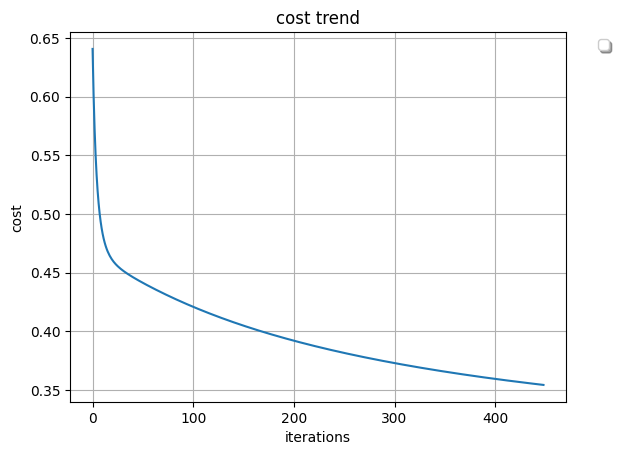

TEST DATA
RECALL 0.1451048951048951
PRECISION 0.8217821782178217
F1 SCORE 0.24665676077265972
ACCURACY SCORE 0.8629359286293593


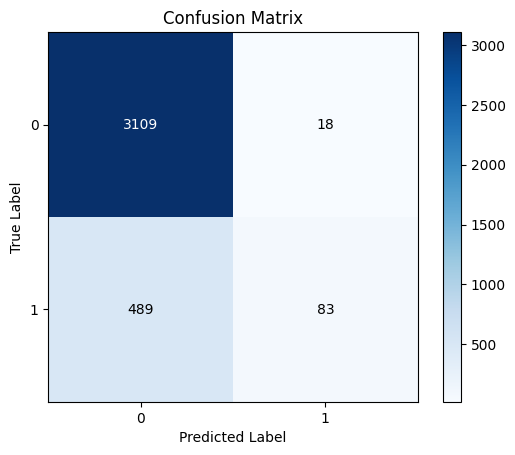

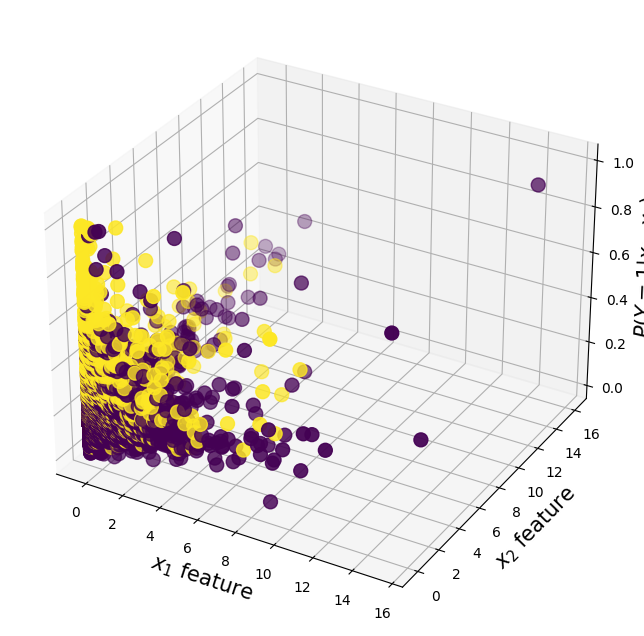

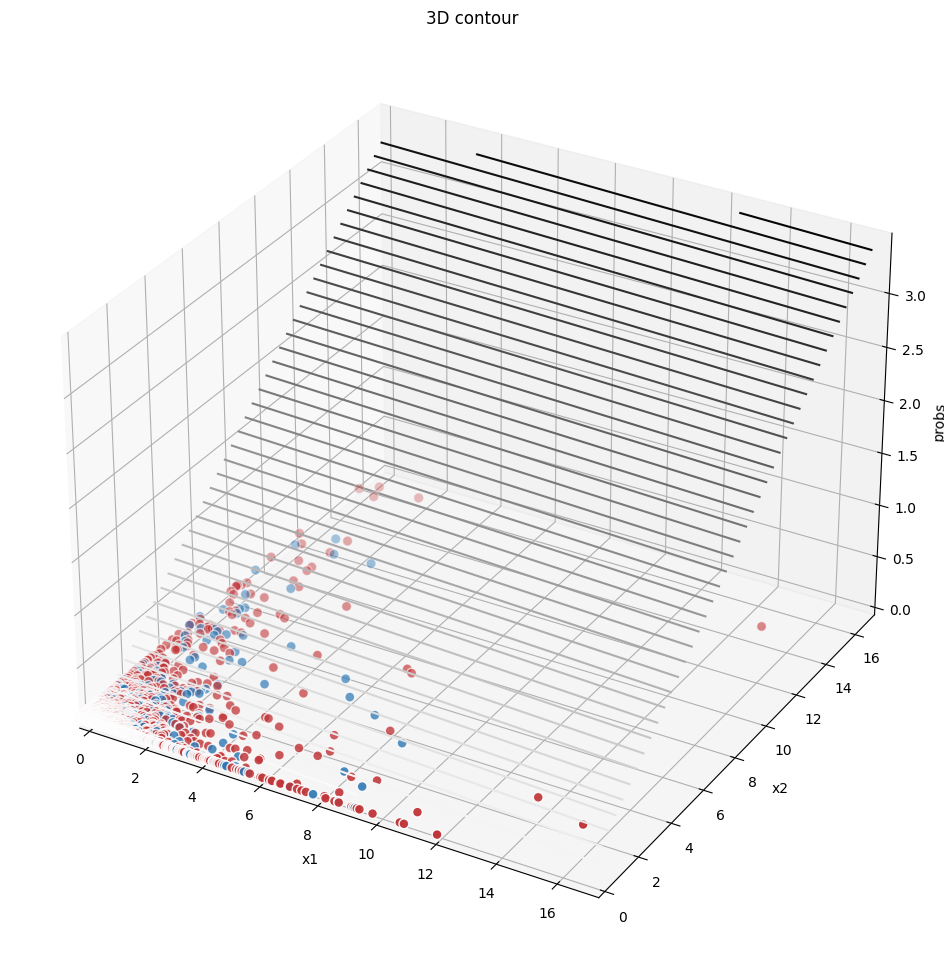

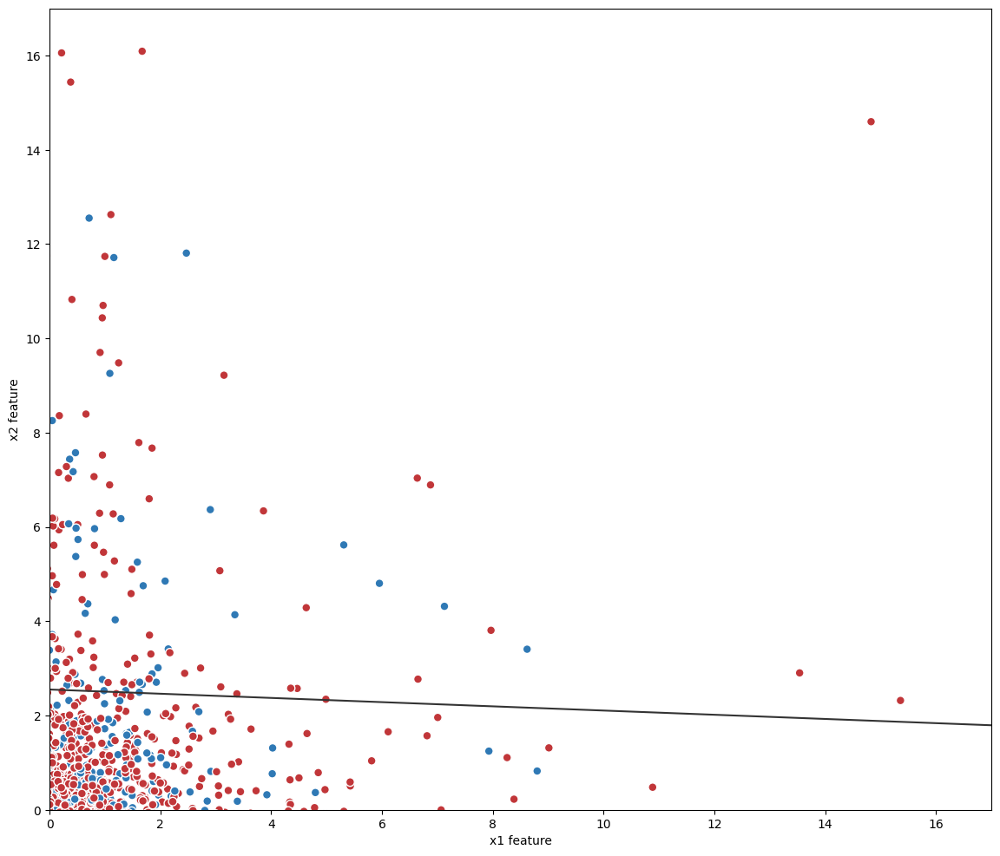

In [ ]:
%time
lr = LogisticRegression(X,y,epsilon=0.0001, learning_rate=0.1e-5, max_iteration=10000)
lr.fit()
lr.plot()
lr.plot3D()
lr.scatterPlt()

CPU times: user 5 µs, sys: 0 ns, total: 5 µs
Wall time: 8.82 µs


 23%|██▎       | 2326/10000 [00:06<00:20, 369.20it/s]


MODEL STOPPED LEARNING


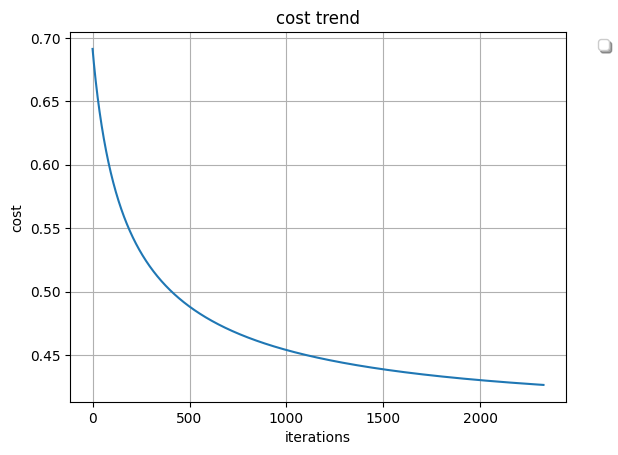

TEST DATA
RECALL 0.7803006076111288
PRECISION 0.8689458689458689
F1 SCORE 0.8222409435551811
ACCURACY SCORE 0.8313079629037416


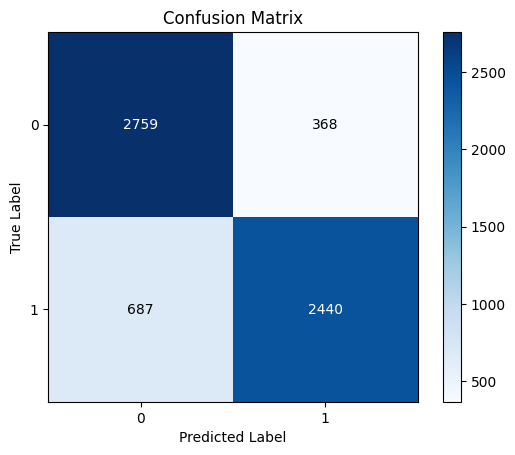

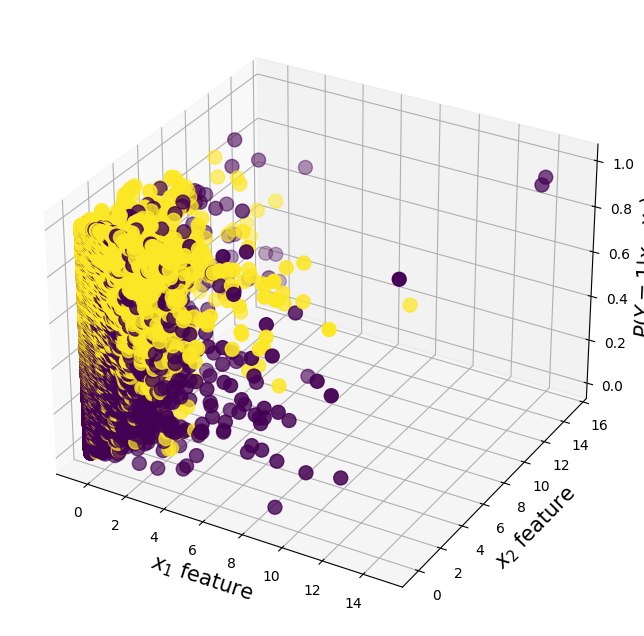

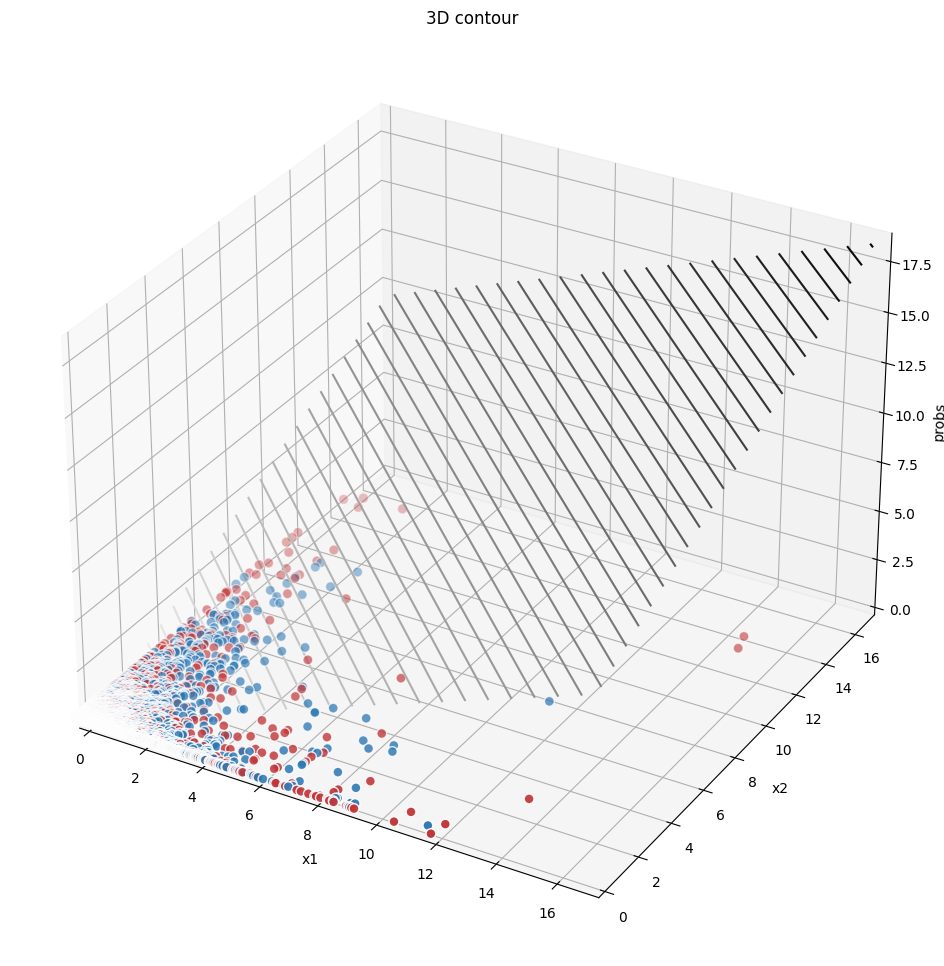

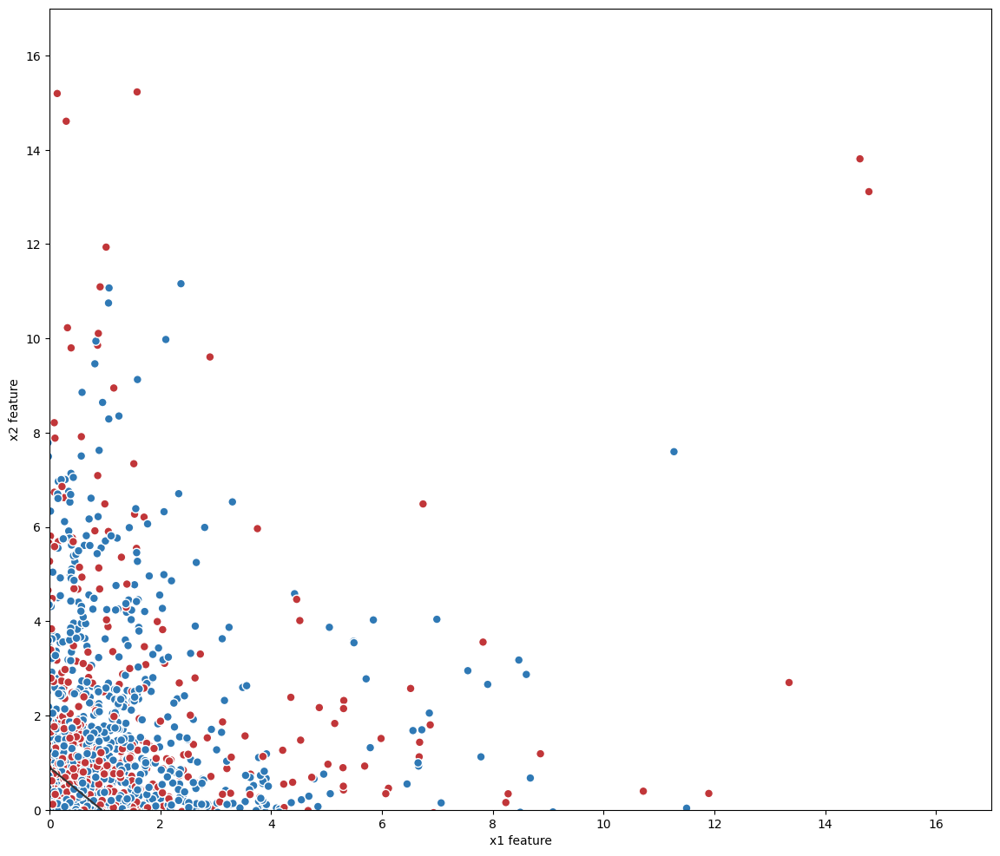

In [ ]:
%time
lr = LogisticRegression(X_resampled,y_resampled,epsilon=0.00001, learning_rate=0.1e-5, max_iteration=10000)
lr.fit()
lr.plot()
lr.plot3D()
lr.scatterPlt()

## REGULARIZED LOGISTIC REGRESSION

In [ ]:
@dataclass
class LogisticRegression:
    X: np.matrix
    y: np.array
    learning_rate: np.float32
    epsilon: np.float32
    max_iteration: int
    regularization_param: np.float32  # Added regularization parameter
    def __post_init__(self):
        self.X_train, self.X_test, self.y_train, self.y_test = self.split_data()
        self.X_train, mean, std = self.normalize_train_data(self.X_train)
        self.X_test = self.normalize_test_data(self.X_test, mean, std)
    def split_data(self):
      X_train,X_test,y_train,y_test=train_test_split(self.X
                                                     ,self.y
                                                     ,test_size=0.3
                                                     ,shuffle=True,
                                                     stratify=self.y)
      return X_train.values,X_test.values,y_train.values,y_test.values
    def normalize_train_data(self,X):
      X_numeric=X[:, :8]
      X_categorical=X[:, -6:]
      mean=np.mean(X_numeric,axis=0)
      std=np.std(X_numeric,axis=0)
      X_norm =(X_numeric-mean)/std
      X_norm = np.concatenate((X_norm, X_categorical), axis=1)
      return X_norm, mean, std
    def normalize_test_data(self,X,mean,std):
      X_numeric=X[:, :8]
      X_categorical=X[:, -6:]
      X_norm =(X_numeric-mean)/std
      X_norm = np.concatenate((X_norm, X_categorical), axis=1)
      return X_norm

    def sigmoid(self, X):
      z = X.dot(self.w)
      sig = 1 / (1 + np.exp(-z))
      #sig = np.clip(sig, 1e-8, 1 - 1e-8)  # Add epsilon adjustment
      return sig

    def predict(self,X):
      sig = self.sigmoid(X)
      return np.around(sig)

    def cost_function(self, X, y):
        sig = self.sigmoid(X)
        cost = y * (np.log(sig)) + (1 - y) * np.log(1 - sig)
        cost = -cost.sum() / len(y)
        # Add regularization term
        reg_term = (self.regularization_param / (2 * len(y))) * np.sum(self.w[1:]**2)
        cost += reg_term
        return cost
    def plot_confusion_matrix(self, y_true, y_pred):
        cm = confusion_matrix(y_true, y_pred)
        classes = np.unique(y_true)
        plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
        plt.title('Confusion Matrix')
        plt.colorbar()
        tick_marks = np.arange(len(classes))
        plt.xticks(tick_marks, classes)
        plt.yticks(tick_marks, classes)

        thresh = cm.max() / 2
        for i in range(cm.shape[0]):
            for j in range(cm.shape[1]):
                plt.text(j, i, cm[i, j], ha='center', va='center',
                         color='white' if cm[i, j] > thresh else 'black')

        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.show()

    def cost_derivative(self, X, y):
        sig = self.sigmoid(X)
        return ((sig - y).dot(X) + self.regularization_param * self.w) / len(y)

    def gradient_descent(self,X,y):
      errors=[]
      n=0
      previous_error = 0
      for i in tqdm(range(self.max_iteration),colour='red'):
        self.w=self.w-(self.learning_rate * self.cost_derivative(X,y))
        current_error=self.cost_function(X,y)
        errors.append(current_error)
        #if(np.absolute(previous_error-current_error)<self.epsilon):
          #print('MODEL STOPPED LEARNING')
          #break
        previous_error+=current_error
        n=n+1
      #print(errors)
      #print(previous_error)
      #print(n)
      return previous_error/n

    def efficacy_report(self, y_hat, y):
      y_hat = y_hat == 1
      y = y == 1
      correct=np.sum(y_hat==y)
      accuracy = correct / len(y)
      tp = (y_hat & y).sum()
      fn = y.sum() - tp
      recall = tp / (tp + fn)
      precision = tp / y_hat.sum()
      f1_score = 2 * precision * recall / (precision + recall)
      return recall, precision, f1_score, accuracy


    def fit(self):
      costs=[]
      reg=[]
      for i in range(0,5):
        self.w = np.ones(self.X_train.shape[1],dtype=np.float64)*0
        cost=self.gradient_descent(self.X_train,self.y_train)
        '''
        print(self.regularization_param)
        print('TEST DATA')
        y_hat_test=self.predict(self.X_test)
        recall,precision,f1_score,accuracy=self.efficacy_report(y_hat_test,self.y_test)
        print('RECALL {}'.format(recall))
        print('PRECISION {}'.format(precision))
        print('F1 SCORE {}'.format(f1_score))
        print('ACCURACY SCORE {}'.format(accuracy))
        '''
        y_hat_test=self.predict(self.X_test)
        recall,precision,f1_score,accuracy=self.efficacy_report(y_hat_test,self.y_test)
        print('ACCURACY SCORE {}'.format(accuracy))
        reg.append(self.regularization_param)
        costs.append(cost)
        self.regularization_param=self.regularization_param*10
      print(reg)
      print(costs)
      plt.plot(np.array(reg), np.array(costs), marker='o', linestyle='-')
      plt.xlabel('REGULARIZATION PARAMETER')
      plt.ylabel('COST')
      plt.title('Cost Plot')
      plt.show()
      self.plot_confusion_matrix(self.y_test, y_hat_test)


    def plot_cost(self,cost_sequence):
      s = np.array(cost_sequence)
      t = np.arange(s.size)
      fig, ax = plt.subplots()
      ax.plot(t,s)
      ax.set(xlabel = 'iterations', ylabel = 'cost' , title = 'cost trend')
      ax.grid()
      plt.legend(bbox_to_anchor=(1.05,1), loc=2,shadow=True)
      plt.show()

    def plot(self):
        plt.figure(figsize=(12, 8))
        ax = plt.axes(projection='3d')
        # Data for three-dimensionl scattered points
        ax.scatter3D(self.X_train[:, 0], self.X_train[:, 1],
                     self.sigmoid(self.X_train),
                     c = self.y_train[:], cmap='viridis', s=100);
        #ax.set_xlim3d(55, 80)
        #ax.set_ylim3d(80, 240)
        plt.xlabel('$x_1$ feature', fontsize=15)
        plt.ylabel('$x_2$ feature', fontsize=15, )
        ax.set_zlabel('$P(Y = 1|x_1, x_2)$', fontsize=15, rotation = 0)

    def scatterPlt(self):
        # evenly sampled points
        x_min, x_max = 0, 17
        y_min, y_max = 0, 17

        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 250),
                             np.linspace(y_min, y_max, 250))
        grid = np.c_[xx.ravel(), yy.ravel()]
        probs = grid.dot(self.w).reshape(xx.shape)

        f, ax = plt.subplots(figsize=(14,12))


        ax.contour(xx, yy, probs, levels=[0.5], cmap="Greys", vmin=0, vmax=.6)


        ax.scatter(self.X_train[:, 0], self.X_train[:, 1],
                   c=self.y_train[:], s=50,
                   cmap="RdBu", vmin=-.2, vmax=1.2,
                   edgecolor="white", linewidth=1)
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        plt.xlabel('x1 feature')
        plt.ylabel('x2 feature')


    def plot3D(self):
        # evenly sampled points
        x_min, x_max = 0, 17
        y_min, y_max = 0, 17

        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 250),
                             np.linspace(y_min, y_max, 250))

        grid = np.c_[xx.ravel(), yy.ravel()]
        self.w = np.random.rand(2, 1)
        probs = grid.dot(self.w).reshape(xx.shape)
        fig = plt.figure(figsize=(14,12))
        ax = plt.axes(projection='3d')
        ax.contour3D(xx, yy, probs, 50, cmap='binary')

        ax.scatter3D(self.X_train[:, 0], self.X_train[:, 1],
                   c=self.y_train[:], s=50,
                   cmap="RdBu", vmin=-.2, vmax=1.2,
                   edgecolor="white", linewidth=1)

        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.set_zlim(np.min(probs), np.max(probs))

        ax.set_xlabel('x1')
        ax.set_ylabel('x2')
        ax.set_zlabel('probs')
        ax.set_title('3D contour')
        plt.show()

CPU times: user 2 µs, sys: 2 µs, total: 4 µs
Wall time: 8.58 µs


100%|██████████| 1000/1000 [00:03<00:00, 271.33it/s]
<ipython-input-75-3491bb768f75>:103: RuntimeWarning: invalid value encountered in long_scalars
  precision = tp / y_hat.sum()


ACCURACY SCORE 0.8453636117869695


100%|██████████| 1000/1000 [00:02<00:00, 355.45it/s]


ACCURACY SCORE 0.8453636117869695


100%|██████████| 1000/1000 [00:03<00:00, 256.37it/s]


ACCURACY SCORE 0.8453636117869695


100%|██████████| 1000/1000 [00:02<00:00, 354.59it/s]


ACCURACY SCORE 0.8453636117869695


100%|██████████| 1000/1000 [00:01<00:00, 521.83it/s]


ACCURACY SCORE 0.8453636117869695
[1e-05, 0.0001, 0.001, 0.01, 0.1]
[0.6899018918467189, 0.6899018918467419, 0.6899018918469642, 0.6899018918492078, 0.689901891871642]


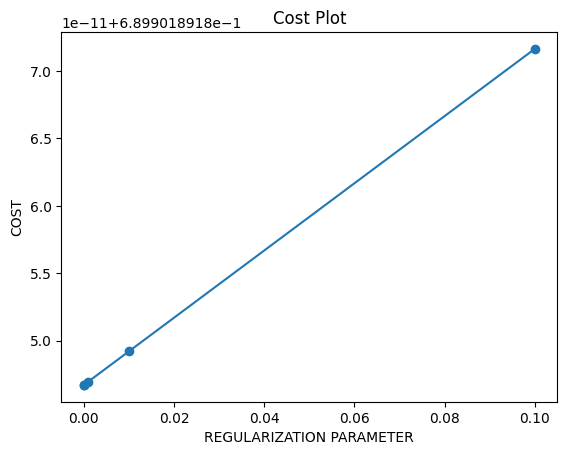

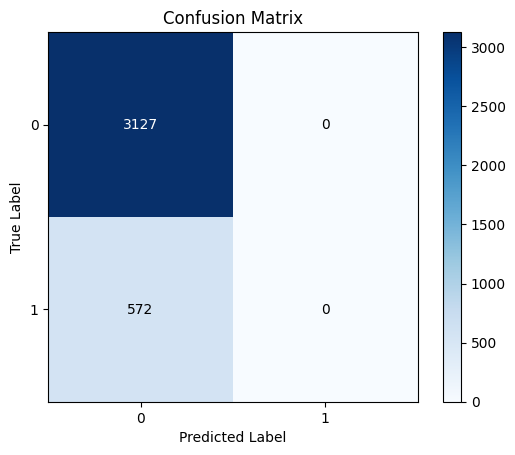

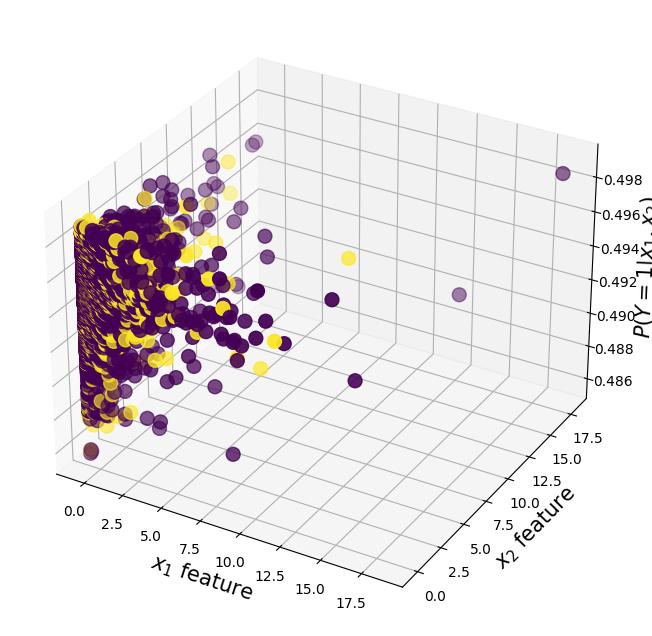

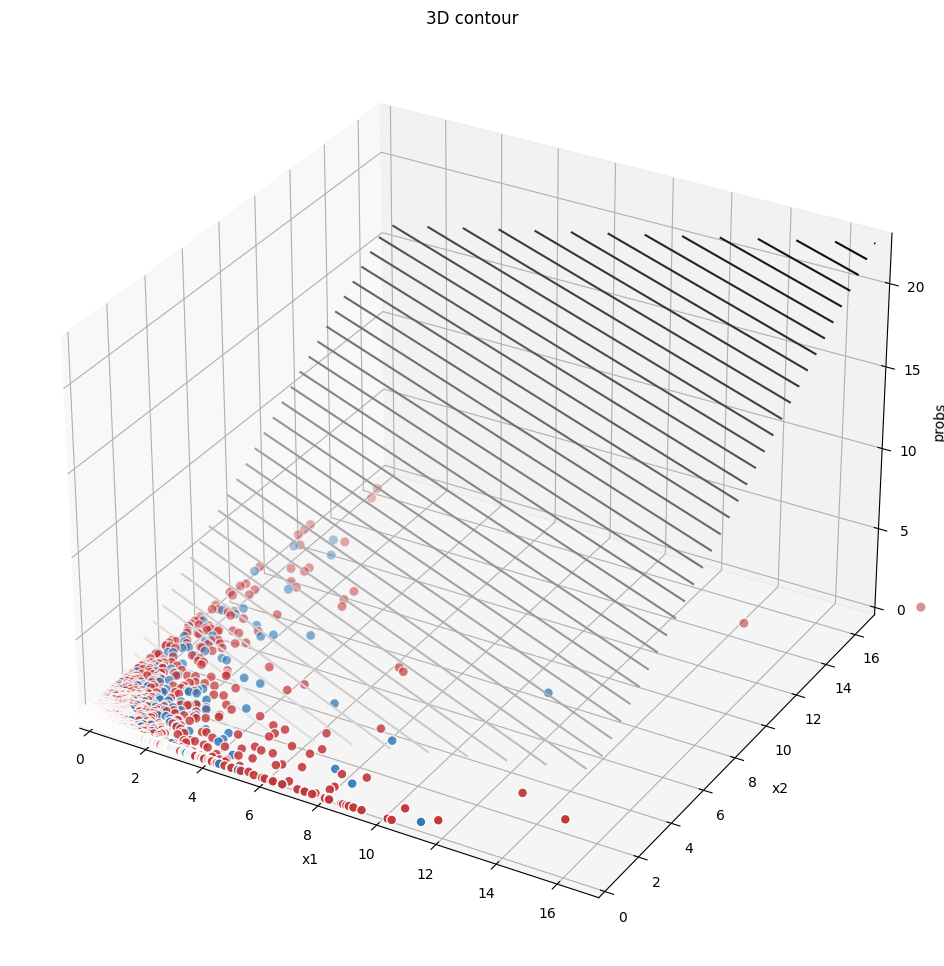

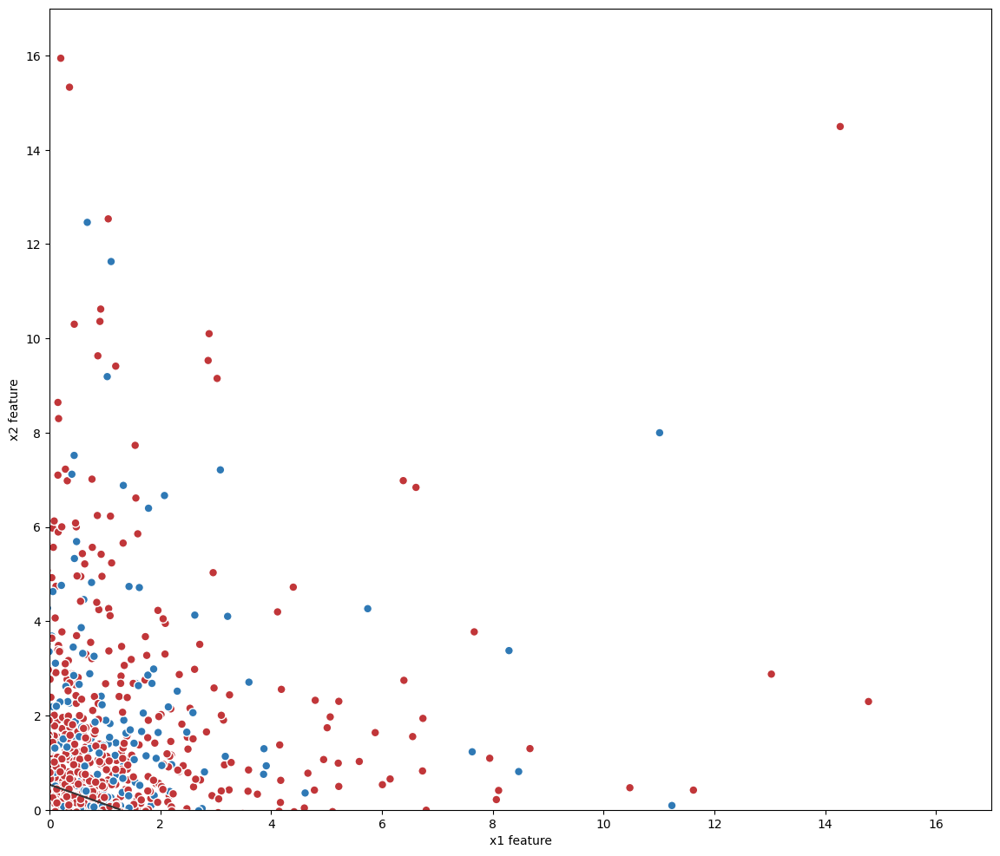

In [ ]:
%time
lr = LogisticRegression(X,y,epsilon=0.00001, learning_rate=0.1e-5, max_iteration=1000,regularization_param=0.00001)
lr.fit()
lr.plot()
lr.plot3D()
lr.scatterPlt()

CPU times: user 5 µs, sys: 0 ns, total: 5 µs
Wall time: 9.78 µs


100%|██████████| 1000/1000 [00:02<00:00, 480.67it/s]


ACCURACY SCORE 0.6543012472017908


100%|██████████| 1000/1000 [00:02<00:00, 491.99it/s]


ACCURACY SCORE 0.6543012472017908


100%|██████████| 1000/1000 [00:05<00:00, 195.30it/s]


ACCURACY SCORE 0.6543012472017908


100%|██████████| 1000/1000 [00:02<00:00, 498.51it/s]


ACCURACY SCORE 0.6543012472017908


100%|██████████| 1000/1000 [00:02<00:00, 486.13it/s]


ACCURACY SCORE 0.6543012472017908
[0.001, 0.01, 0.1, 1.0, 10.0]
[0.6930840573899025, 0.6930840573899267, 0.6930840573901833, 0.6930840573927499, 0.6930840574183911]


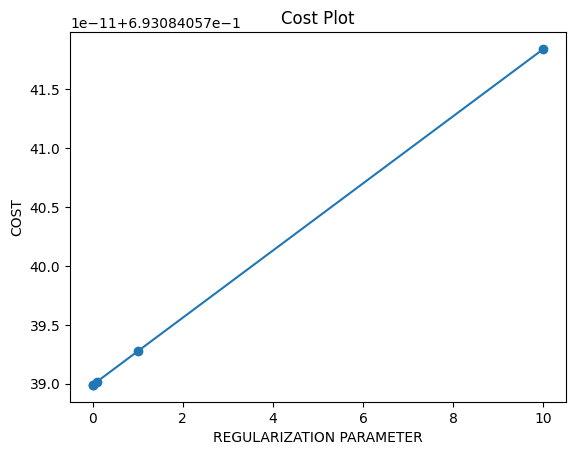

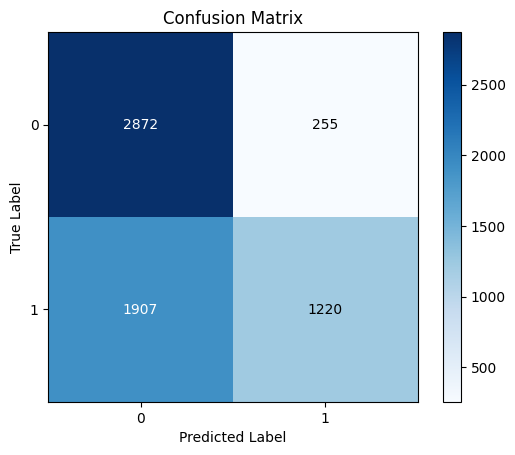

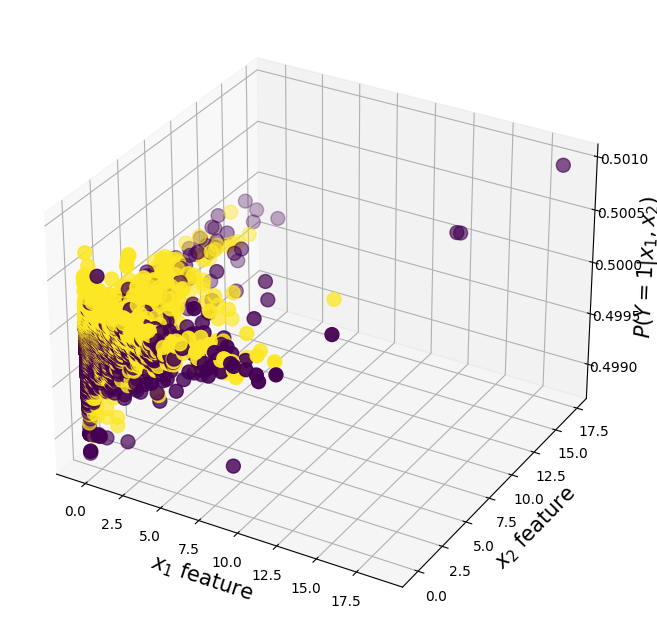

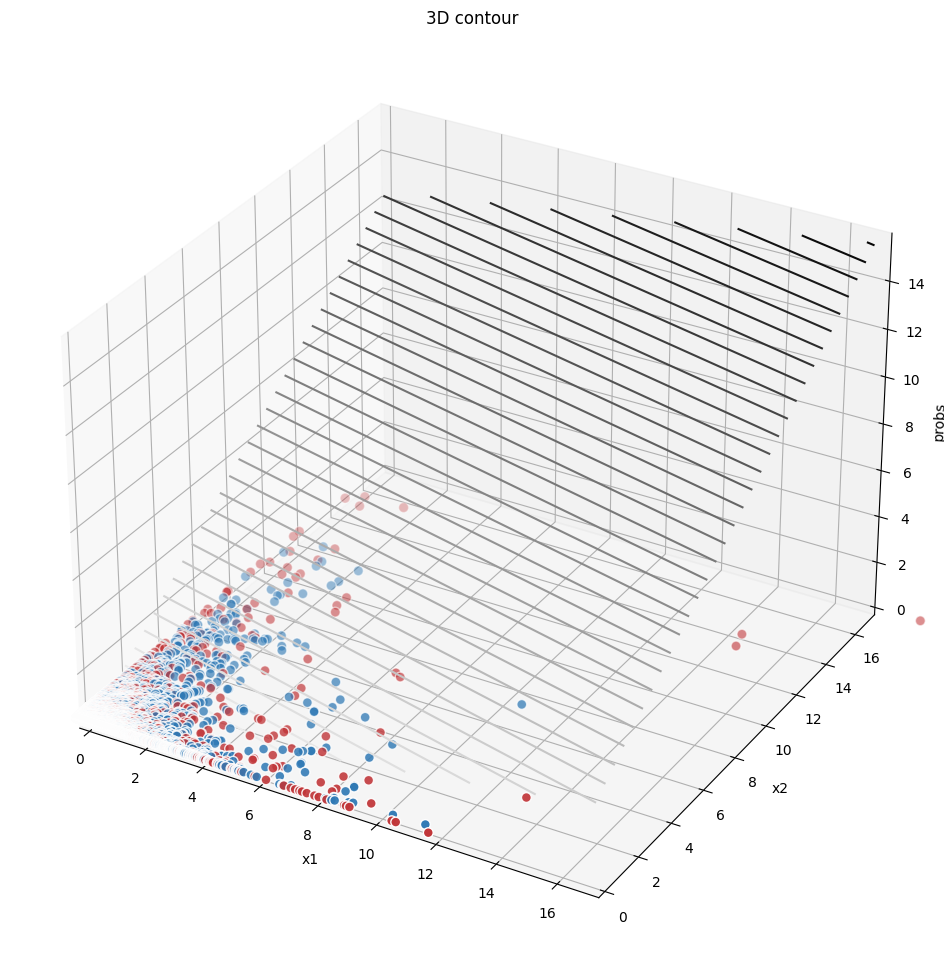

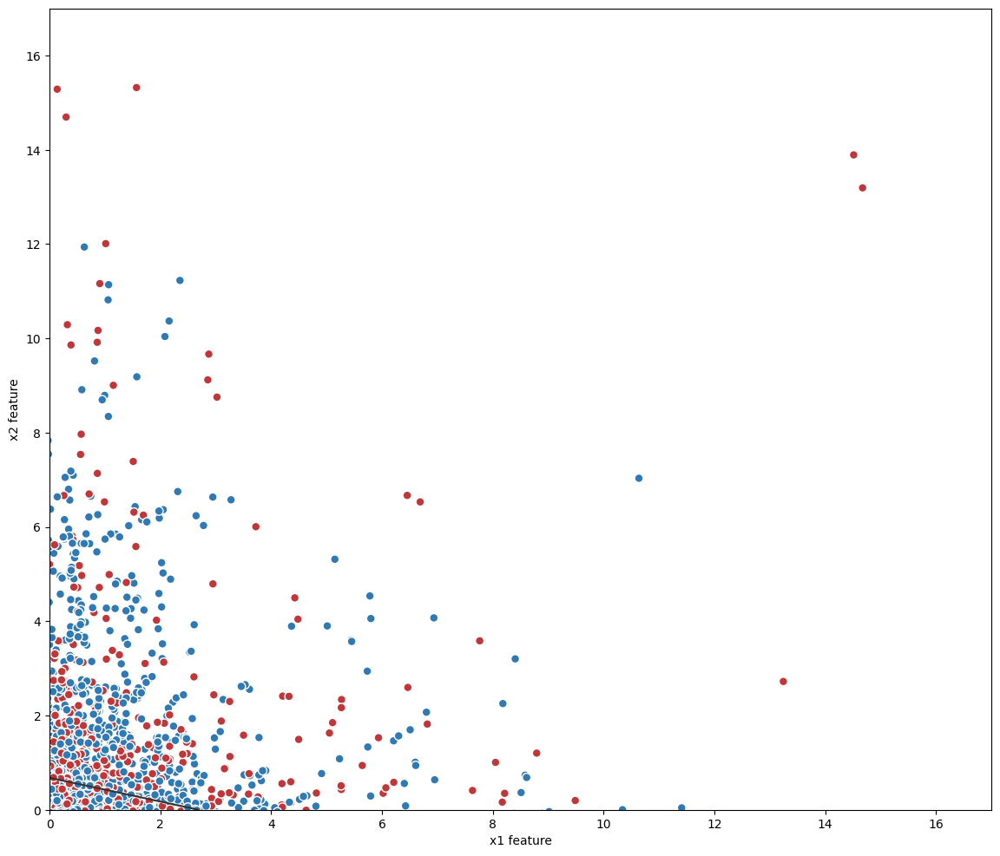

In [ ]:
%time
lr = LogisticRegression(X_resampled,y_resampled,epsilon=0.000001, learning_rate=0.1e-5, max_iteration=1000,regularization_param=0.001)
lr.fit()
lr.plot()
lr.plot3D()
lr.scatterPlt()

## NEWTON GRADIENT OPTIMIZATION

In [ ]:
@dataclass
class LogisticRegression:

    X:np.matrix
    y:np.array
    learning_rate :np.float32
    epsilon: np.float32
    max_iteration:int


    def __post_init__(self):
      self.X_train,self.X_test,self.y_train,self.y_test = self.split_data()
      self.X_train,mean,std=self.normalize_train_data(self.X_train)
      self.X_test=self.normalize_test_data(self.X_test,mean,std)

    def split_data(self):
      X_train,X_test,y_train,y_test=train_test_split(self.X
                                                     ,self.y
                                                     ,test_size=0.3
                                                     ,shuffle=True,
                                                     stratify=self.y)

      return X_train.values,X_test.values,y_train.values,y_test.values

    def normalize_train_data(self,X):
      X_numeric=X[:, :8]
      X_categorical=X[:, -6:]
      mean=np.mean(X_numeric,axis=0)
      std=np.std(X_numeric,axis=0)
      X_norm =(X_numeric-mean)/std
      X_norm = np.concatenate((X_norm, X_categorical), axis=1)
      return X_norm, mean, std

    def normalize_test_data(self,X,mean,std):
      X_numeric=X[:, :8]
      X_categorical=X[:, -6:]
      X_norm =(X_numeric-mean)/std
      X_norm = np.concatenate((X_norm, X_categorical), axis=1)
      return X_norm

    def sigmoid(self, X):
      z = X.dot(self.w)
      sig = 1 / (1 + np.exp(-z))
      #sig = np.clip(sig, 1e-8, 1 - 1e-8)  # Add epsilon adjustment
      return sig


    def predict(self,X):
      sig = self.sigmoid(X)
      return np.around(sig)

    def cost_function(self,X,y):
      sig=self.sigmoid(X)
      cost=y*(np.log(sig))+(1-y)*np.log(1-sig)
      cost = -cost.sum()/len(y)
      return cost

    def cost_derivative(self,X,y):
      sig=self.sigmoid(X)
      return ((sig-y).dot(X))

    def newton_update(self, X, y):
        sig = self.sigmoid(X)
        gradient = self.cost_derivative(X, y)
        hessian = np.dot(X.T * sig * (1 - sig), X)
        h_inv = np.linalg.inv(hessian)
        self.w -= np.dot(h_inv, gradient)

    def plot_confusion_matrix(self, y_true, y_pred):
        cm = confusion_matrix(y_true, y_pred)
        classes = np.unique(y_true)
        plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
        plt.title('Confusion Matrix')
        plt.colorbar()
        tick_marks = np.arange(len(classes))
        plt.xticks(tick_marks, classes)
        plt.yticks(tick_marks, classes)

        thresh = cm.max() / 2
        for i in range(cm.shape[0]):
            for j in range(cm.shape[1]):
                plt.text(j, i, cm[i, j], ha='center', va='center',
                         color='white' if cm[i, j] > thresh else 'black')

        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.show()

    def newton_gradient_descent(self, X, y):
        errors = []
        previous_error = float('inf')
        for i in tqdm(range(self.max_iteration), colour='red'):
            self.newton_update(X, y)
            current_error = self.cost_function(X, y)
            errors.append(current_error)
            if np.absolute(previous_error - current_error) < self.epsilon:
                print('MODEL STOPPED LEARNING')
                break
            previous_error = current_error
        self.plot_cost(errors)

    def gradient_descent(self,X,y):
      errors=[]
      previous_error = float('inf')
      for i in tqdm(range(self.max_iteration),colour='red'):
        self.w=self.w-(self.learning_rate * self.cost_derivative(X,y))
        current_error=self.cost_function(X,y)
        errors.append(current_error)
        if(np.absolute(previous_error-current_error)<self.epsilon):
          print('MODEL STOPPED LEARNING')
          break
        previous_error=current_error
      self.plot_cost(errors)


    def efficacy_report(self, y_hat, y):
      y_hat = y_hat == 1
      y = y == 1
      tp = (y_hat & y).sum()
      fn = y.sum() - tp
      recall = tp / (tp + fn)
      precision = tp / y_hat.sum()
      correct=np.sum(y_hat==y)
      accuracy= correct / len(y)
      f1_score = 2 * precision * recall / (precision + recall)
      return recall, precision, f1_score,accuracy


    def fit(self):
      self.w = np.ones(self.X_train.shape[1],dtype=np.float64)*0
      self.newton_gradient_descent(self.X_train,self.y_train)
      print('TEST DATA')
      y_hat_test=self.predict(self.X_test)
      recall,precision,f1_score,accuracy=self.efficacy_report(y_hat_test,self.y_test)
      print('RECALL {}'.format(recall))
      print('PRECISION {}'.format(precision))
      print('F1 SCORE {}'.format(f1_score))
      print('ACCURACY SCORE {}'.format(accuracy))
      self.plot_confusion_matrix(self.y_test, y_hat_test)


    def plot_cost(self,cost_sequence):

      s = np.array(cost_sequence)
      t = np.arange(s.size)

      fig, ax = plt.subplots()
      ax.plot(t,s)

      ax.set(xlabel = 'iterations', ylabel = 'cost' , title = 'cost trend')
      ax.grid()
      plt.legend(bbox_to_anchor=(1.05,1), loc=2,shadow=True)
      plt.show()



    def plot(self):
        plt.figure(figsize=(12, 8))
        ax = plt.axes(projection='3d')

        # Data for three-dimensional scattered points
        ax.scatter3D(self.X_train[:, 0], self.X_train[:, 1],
                     self.sigmoid(self.X_train),
                     c = self.y_train[:], cmap='viridis', s=100);

        #ax.set_xlim3d(55, 80)
        #ax.set_ylim3d(80, 240)
        plt.xlabel('$x_1$ feature', fontsize=15)
        plt.ylabel('$x_2$ feature', fontsize=15, )
        ax.set_zlabel('$P(Y = 1|x_1, x_2)$', fontsize=15, rotation = 0)



    def scatterPlt(self):
        # evenly sampled points
        x_min, x_max = 0, 17
        y_min, y_max = 0, 17

        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 250),
                             np.linspace(y_min, y_max, 250))
        grid = np.c_[xx.ravel(), yy.ravel()]
        probs = grid.dot(self.w).reshape(xx.shape)

        f, ax = plt.subplots(figsize=(14,12))


        ax.contour(xx, yy, probs, levels=[0.5], cmap="Greys", vmin=0, vmax=.6)


        ax.scatter(self.X_train[:, 0], self.X_train[:, 1],
                   c=self.y_train[:], s=50,
                   cmap="RdBu", vmin=-.2, vmax=1.2,
                   edgecolor="white", linewidth=1)
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        plt.xlabel('x1 feature')
        plt.ylabel('x2 feature')


    def plot3D(self):
        # evenly sampled points
        x_min, x_max = 0, 17
        y_min, y_max = 0, 17

        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 250),
                             np.linspace(y_min, y_max, 250))

        grid = np.c_[xx.ravel(), yy.ravel()]
        self.w = np.random.rand(2, 1)
        probs = grid.dot(self.w).reshape(xx.shape)
        fig = plt.figure(figsize=(14,12))
        ax = plt.axes(projection='3d')
        ax.contour3D(xx, yy, probs, 50, cmap='binary')

        ax.scatter3D(self.X_train[:, 0], self.X_train[:, 1],
                   c=self.y_train[:], s=50,
                   cmap="RdBu", vmin=-.2, vmax=1.2,
                   edgecolor="white", linewidth=1)

        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.set_zlim(np.min(probs), np.max(probs))

        ax.set_xlabel('x1')
        ax.set_ylabel('x2')
        ax.set_zlabel('probs')
        ax.set_title('3D contour')
        plt.show()

CPU times: user 3 µs, sys: 2 µs, total: 5 µs
Wall time: 10.3 µs


  0%|          | 0/10000 [00:00<?, ?it/s]<ipython-input-78-c51786cbe192>:54: RuntimeWarning: divide by zero encountered in log
  cost=y*(np.log(sig))+(1-y)*np.log(1-sig)
<ipython-input-78-c51786cbe192>:54: RuntimeWarning: invalid value encountered in multiply
  cost=y*(np.log(sig))+(1-y)*np.log(1-sig)
100%|██████████| 10000/10000 [00:52<00:00, 191.27it/s]


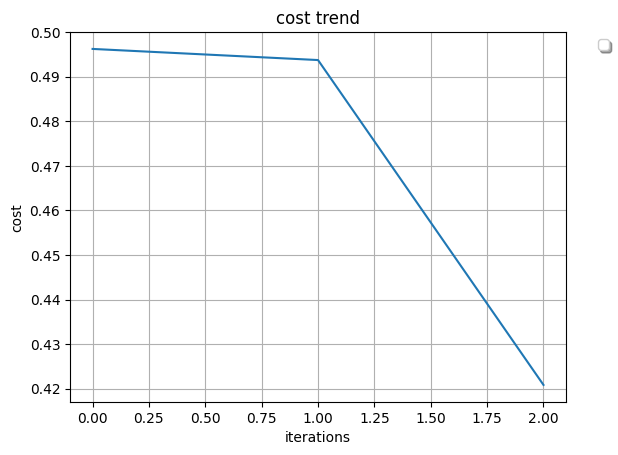

TEST DATA
RECALL 0.771026543012472
PRECISION 0.8767272727272727
F1 SCORE 0.820486642844989
ACCURACY SCORE 0.8313079629037416


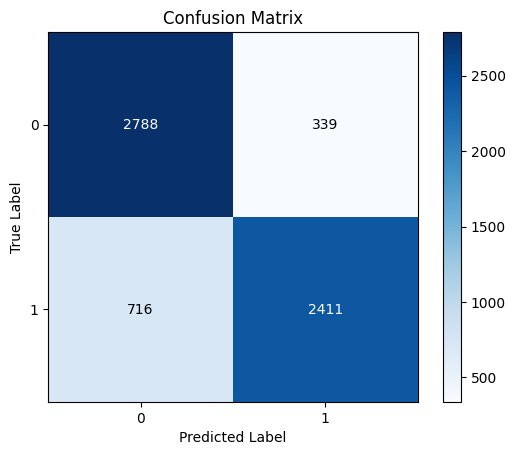

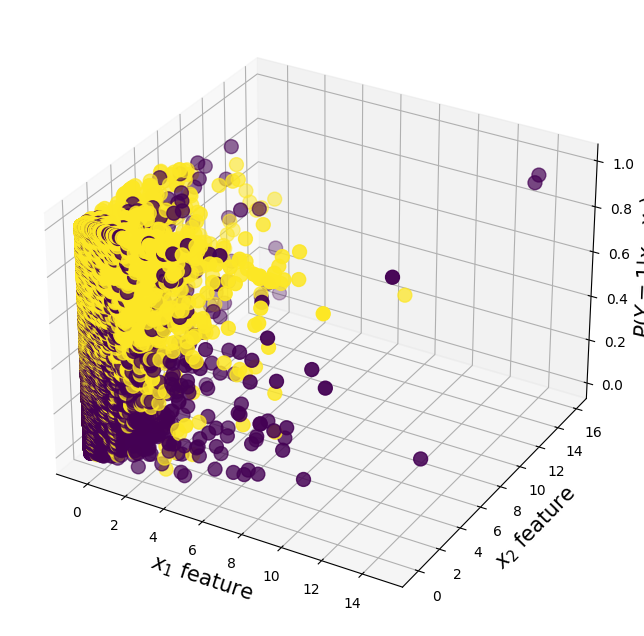

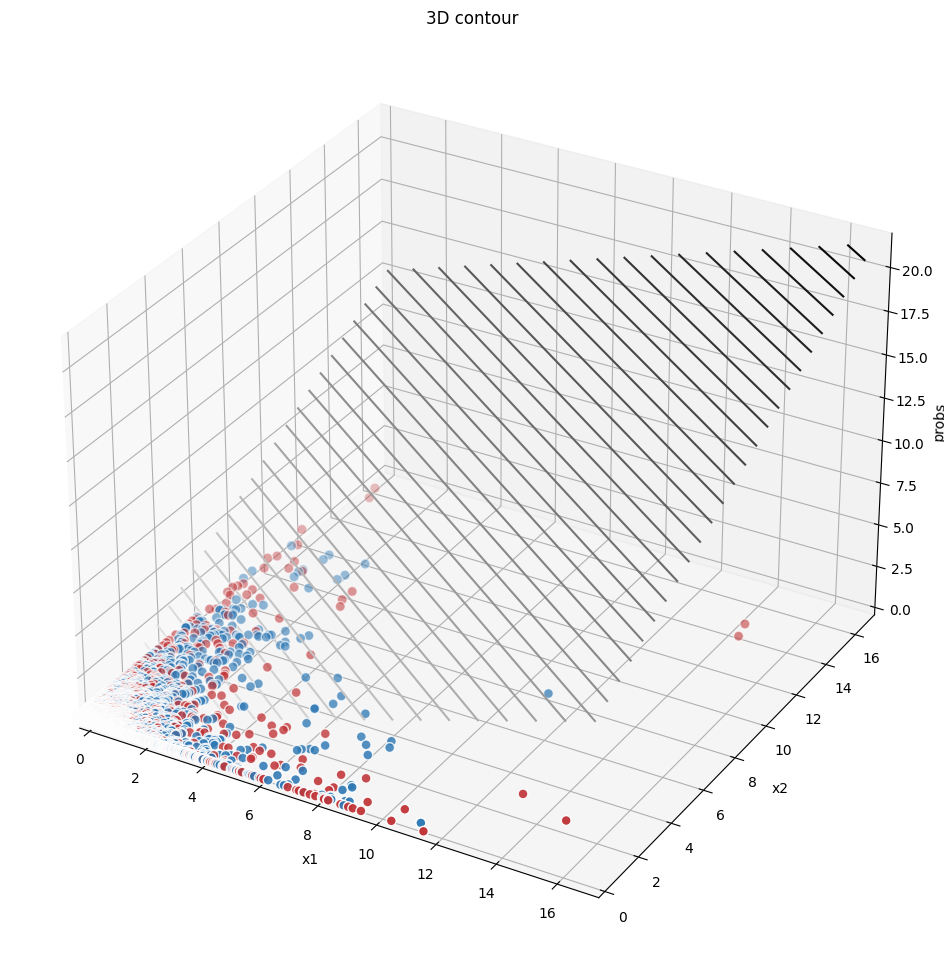

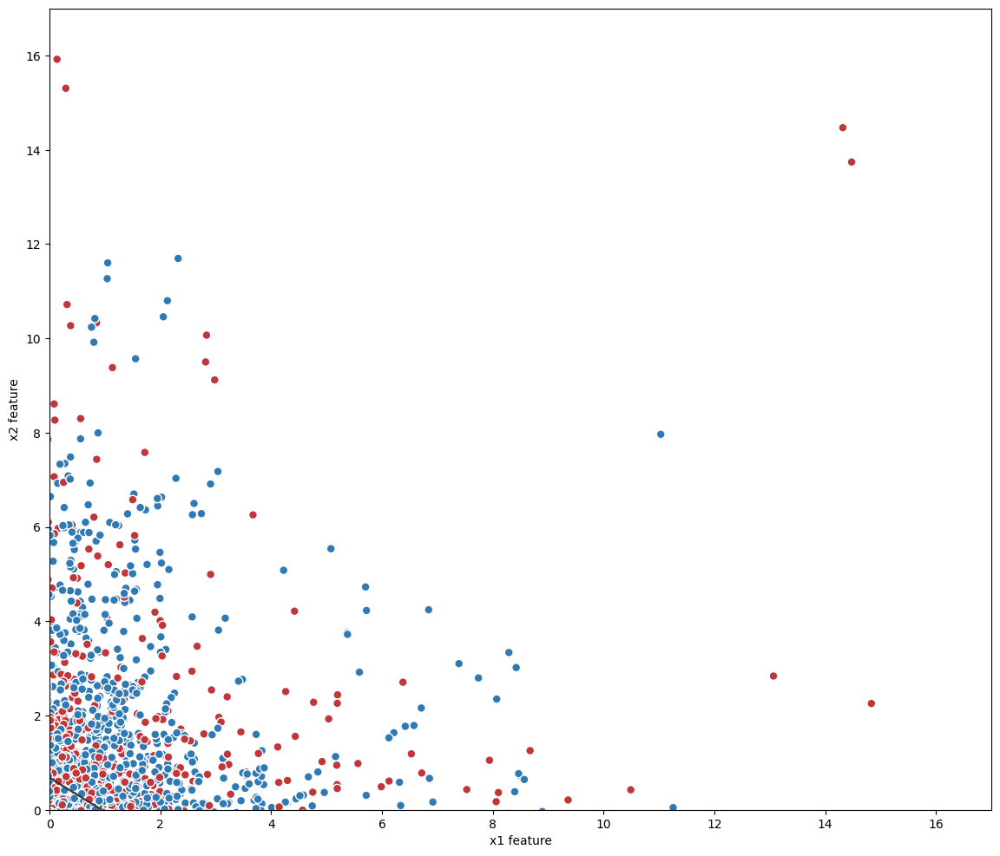

In [ ]:
%time
lr = LogisticRegression(X_resampled,y_resampled,epsilon=0.0001, learning_rate=0.1e-5, max_iteration=10000)
lr.fit()
lr.plot()
lr.plot3D()
lr.scatterPlt()

CPU times: user 5 µs, sys: 0 ns, total: 5 µs
Wall time: 10.5 µs


  0%|          | 7/10000 [00:00<01:42, 97.42it/s]

MODEL STOPPED LEARNING


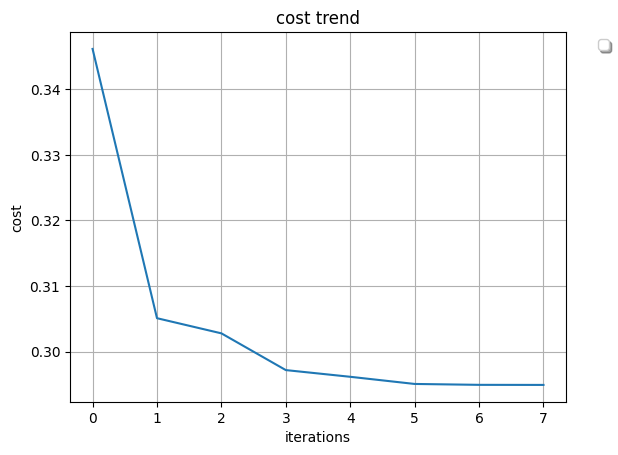

TEST DATA
RECALL 0.3548951048951049
PRECISION 0.7173144876325088
F1 SCORE 0.4748538011695907
ACCURACY SCORE 0.8786158421194917


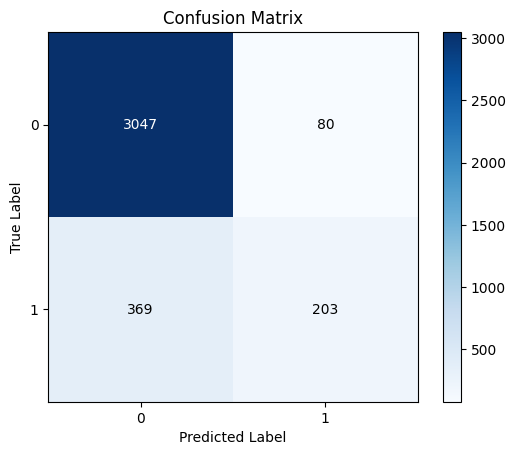

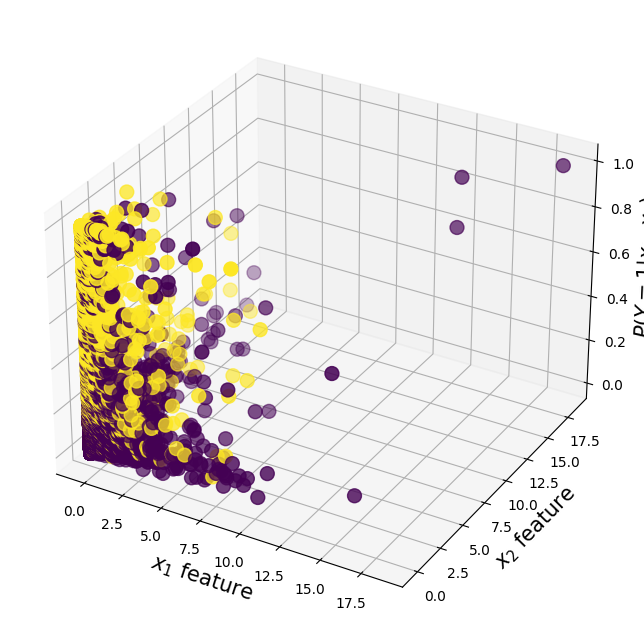

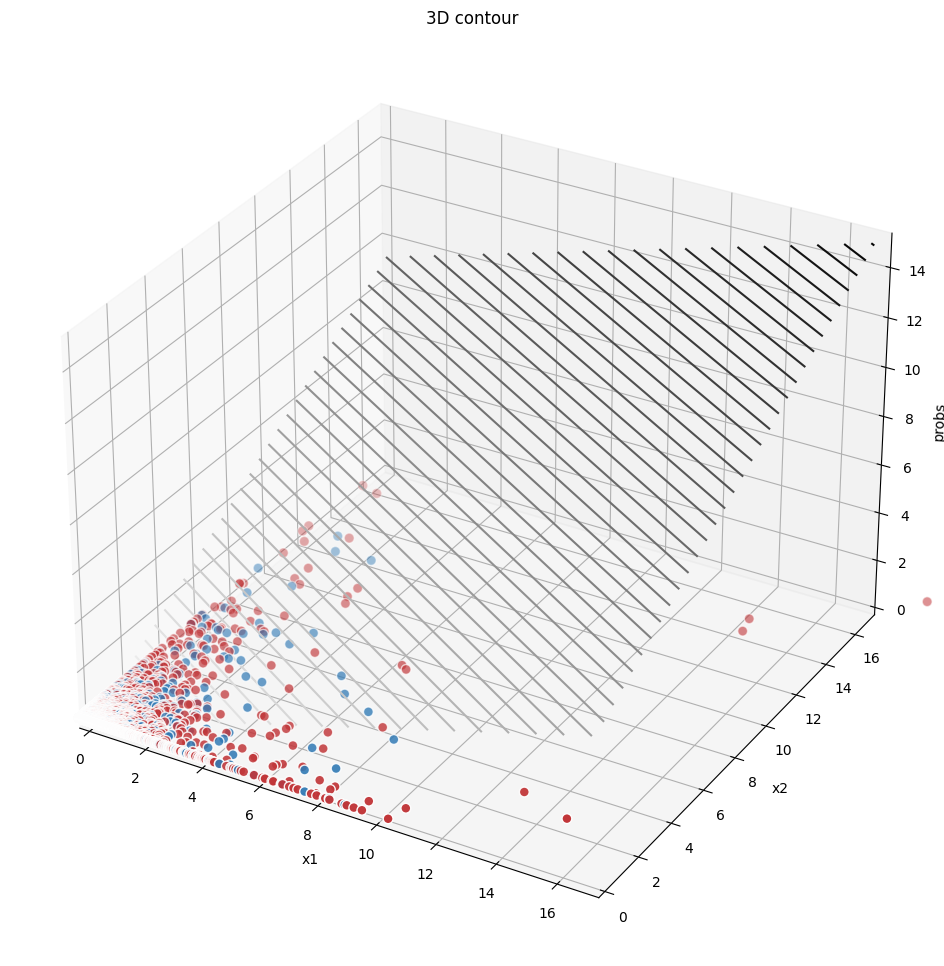

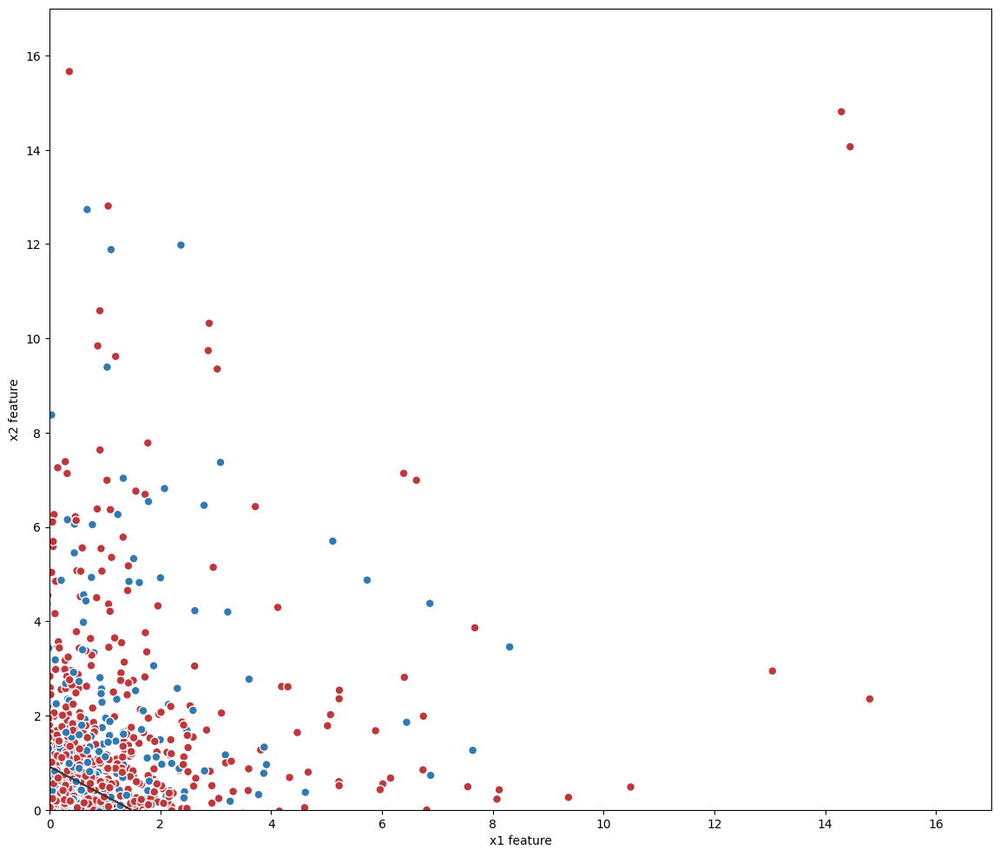

In [ ]:
%time
lr = LogisticRegression(X,y,epsilon=0.0001, learning_rate=0.1e-5, max_iteration=10000)
lr.fit()
lr.plot()
lr.plot3D()
lr.scatterPlt()

## K means clustering to prove data is not linearly separable

In [ ]:
# In addition to pairplot, we use K means clustering to prove that data is not linearly separable and hence soft margin SVM should be used

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


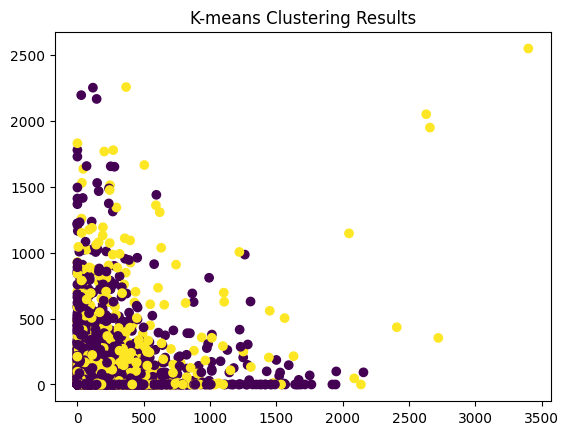

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans


# Define the number of clusters
k = 2

# Get the selected features as a DataFrame
X = df.iloc[:, 0:]  # Selecting all columns as features

# Apply K-means clustering
kmeans = KMeans(n_clusters=k)
kmeans.fit(X)

# Get the cluster labels
labels = kmeans.labels_

# Plot the data points
plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=labels)
plt.title('K-means Clustering Results')
plt.show()


## SOFT MARIGN SVM

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=True, stratify=y)
# Reset indices of X_train and y_train
X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)

train_data = pd.concat([X_train, y_train], axis=1)

In [ ]:
class_0_data = train_data[train_data['Revenue'] == 0]  # Subset of data belonging to class 0
class_1_data = train_data[train_data['Revenue'] == 1]  # Subset of data belonging to class 1
# Randomly sample 50 instances from each class
class_0_subset = class_0_data.sample(n=1000, random_state=42)
class_1_subset = class_1_data.sample(n=1000, random_state=42)
# Combine the two subsets to create the final dataset
SVM_data = pd.concat([class_0_subset, class_1_subset])
# Separate features and labels
X_subset = SVM_data.drop('Revenue', axis=1)
y_subset = SVM_data['Revenue']

In [ ]:
# Reset indices of X_train and y_train
X_test = X_test.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)
# Concatenate X_train and y_train
test_data = pd.concat([X_test, y_test], axis=1)

In [ ]:
test_data = test_data.sample(n=600,random_state=42)
X_test = test_data.drop('Revenue',axis=1)
y_test = test_data['Revenue']

In [ ]:
from types import new_class
@dataclass
class SoftMarginSVM:
  C:float

  def fit(self,X,y):
    N,n_features=X.shape
    y_=np.where(y<=0,-1,1)

    Xy=X*y_[:,np.newaxis]

    gramXy=np.matmul(Xy,Xy.T)

    def objectiveFunction(alpha,gramXy):
      return alpha.sum() - 0.5 * alpha.dot(alpha.dot(gramXy))

    def gradientObjectiveFunction(alpha,gramXy):
      return np.ones(N) - alpha.dot(gramXy)

    #self.support_vectors = []
    #self.support_labels = []
    alphas=np.ones(N)
    alpha_bounds=Bounds(np.zeros(N),np.ones(N)*self.C)

    constrains=({'type':'eq','fun': lambda alpha:np.dot(alpha,y_),
                 'jac': lambda alpha:-y_})

    slsqp=optimize.minimize(fun=lambda a: -objectiveFunction(a,gramXy),
                            x0=alphas,
                            jac=lambda a: -gradientObjectiveFunction(a,gramXy),
                            constraints=constrains,
                            bounds=alpha_bounds,
                            method='SLSQP')
    self.alphas=slsqp.x
    self.w=np.sum(Xy.T.dot(self.alphas[:,np.newaxis]),axis=1)

    epsilon=0.0001
    self.support_vectors = X[self.alphas>epsilon]
    self.support_labels = y_[self.alphas>epsilon]

    b=[]
    for i in range(len(self.support_vectors)):
      b_i=self.support_labels[i]-np.matmul(self.support_vectors[i],self.w.T)
      b.append(b_i)
    self.b=sum(b)/len(b)

  def predict(self, X):
      if self.w is None or self.b is None:
            raise RuntimeError("Model not trained yet")

      y_pred = np.sign(np.dot(X, self.w) + self.b)
      return y_pred

  def precision(self, X, y, average=None, zero_division=1):
        y_pred = self.predict(X)
        precision = precision_score(y, y_pred, average=average, zero_division=zero_division)
        return precision

  def recall(self, X, y, average=None, zero_division=1):
        y_pred = self.predict(X)
        recall = recall_score(y, y_pred, average=average, zero_division=zero_division)
        return recall

  def custom_f1_score(self, X, y, average=None, zero_division=1):
        y_pred = self.predict(X)
        f1 = sklearn_f1_score(y, y_pred, average=average, zero_division=zero_division)
        return f1
  def plot_confusion_matrix(self, X, y):

        if self.w is None or self.b is None:

            raise RuntimeError("Model not trained yet")




        y_pred = self.predict(X)

        cm = confusion_matrix(y, y_pred)

        labels = np.unique(y)




        plt.figure(figsize=(4, 3))

        sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=labels, yticklabels=labels)

        plt.xlabel('Predicted')

        plt.ylabel('True')

        plt.title('Confusion Matrix')

        plt.show()

In [ ]:
soft_margin=SoftMarginSVM(C=0.01)

In [ ]:
%time
soft_margin.fit(X_subset.values,y_subset)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.63 µs


In [ ]:
import numpy as np
import matplotlib.pyplot as plt


import matplotlib.pyplot as plt
import matplotlib.colors as pltcolors


def visualize_svm(X, y, clf):
    def get_hyperplane_value(x, w, b, offset):
        return (-w[0] * x + b + offset) / w[1]

    fig = plt.figure()
    ax = fig.add_subplot(1,1,1)
    plt.scatter(X[:,0], X[:,1], marker='o',c=y)

    x0_1 = np.amin(X[:,0])
    x0_2 = np.amax(X[:,0])

    x1_1 = get_hyperplane_value(x0_1, clf.w, clf.b, 0)
    x1_2 = get_hyperplane_value(x0_2, clf.w, clf.b, 0)

    x1_1_m = get_hyperplane_value(x0_1, clf.w, clf.b, -1)
    x1_2_m = get_hyperplane_value(x0_2, clf.w, clf.b, -1)

    x1_1_p = get_hyperplane_value(x0_1, clf.w, clf.b, 1)
    x1_2_p = get_hyperplane_value(x0_2, clf.w, clf.b, 1)

    ax.plot([x0_1, x0_2],[x1_1, x1_2], 'y--')
    ax.plot([x0_1, x0_2],[x1_1_m, x1_2_m], 'k')
    ax.plot([x0_1, x0_2],[x1_1_p, x1_2_p], 'k')

    x1_min = np.amin(X[:,1])
    x1_max = np.amax(X[:,1])
    ax.set_ylim([x1_min-3,x1_max+3])

    plt.show()




colors = ['blue','red']
cmap = pltcolors.ListedColormap(colors)


def generateBatchBipolar(n, mu=0.5, sigma=0.2):
    """ Two gaussian clouds on each side of the origin """
    X = np.random.normal(mu, sigma, (n, 2))
    yB = np.random.uniform(0, 1, n) > 0.5
    # y is in {-1, 1}
    y = 2. * yB - 1
    X *= y[:, np.newaxis]
    X -= X.mean(axis=0)
    return X, y

def plotLine(ax, xRange, w, x0, label, color='grey', linestyle='-', alpha=1.):
    """ Plot a (separating) line given the normal vector (weights) and point of intercept """
    if type(x0) == int or type(x0) == float or type(x0) == np.float64:
        x0 = [0, -x0 / w[1]]
    yy = -(w[0] / w[1]) * (xRange - x0[0]) + x0[1]
    ax.plot(xRange, yy, color=color, label=label, linestyle=linestyle)


def plotSvm(X, y, support=None, w=None, intercept=0., label='Data', separatorLabel='Separator',
            ax=None, bound=[[-1., 1.], [-1., 1.]]):
    """ Plot the SVM separation, and margin """
    if ax is None:
        fig, ax = plt.subplots(1)
    im = ax.scatter(X[:,0], X[:,1], c=y, cmap=cmap, alpha=0.5, label=label)
    if support is not None:
        ax.scatter(support[:,0], support[:,1], label='Support', s=80, facecolors='none',
                   edgecolors='y', color='y')
        print("Number of support vectors = %d" % (len(support)))
    if w is not None:
        xx = np.array(bound[0])
        plotLine(ax, xx, w, intercept, separatorLabel)
        # Plot margin
        if support is not None:
            signedDist = np.matmul(support, w)
            margin = np.max(signedDist) - np.min(signedDist) * np.sqrt(np.dot(w, w))
            supportMaxNeg = support[np.argmin(signedDist)]
            plotLine(ax, xx, w, supportMaxNeg, 'Margin -', linestyle='-.', alpha=0.8)
            supportMaxPos = support[np.argmax(signedDist)]
            plotLine(ax, xx, w, supportMaxPos, 'Margin +', linestyle='--', alpha=0.8)
            ax.set_title('Margin = %.3f' % (margin))
    ax.legend(loc='upper left')
    ax.grid()
    ax.set_xlim(bound[0])
    ax.set_ylim(bound[1])
    cb = plt.colorbar(im, ax=ax)
    loc = np.arange(-1,1,1)
    cb.set_ticks(loc)
    cb.set_ticklabels(['-1','1'])

In [ ]:
soft_margin.w

array([ 5.45665472e+02,  2.06252550e+02,  8.53927664e+03, -2.05538114e-01,
        2.60951174e+02, -4.32000000e-01,  7.03000000e+00, -2.70000000e-01,
        1.27000000e+00, -1.02000000e+00, -1.90000000e+00,  4.10000000e-01])

In [ ]:
soft_margin.b

-12661505.594411414

In [ ]:
precision = soft_margin.precision(X_test.values, y_test, average='macro')
recall = soft_margin.recall(X_test.values, y_test, average='macro')
f1 = soft_margin.custom_f1_score(X_test.values, y_test, average='macro')

In [ ]:
precision

0.3991228070175439

In [ ]:
recall

0.4583333333333333

In [ ]:
f1

0.08620689655172413

In [ ]:
plotSvm(X_subset.values,y_subset,soft_margin.support_vectors,soft_margin.w,soft_margin.b)

In [ ]:
soft_margin.plot_confusion_matrix(X_test,y_test)

## NEURAL NETWORKS

### FEED FORWARD

In [107]:
import math
import numpy as np
import pandas as pd
import h5py
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.python.framework import ops
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
np.random.seed(1)

In [108]:
def random_mini_batches(X, Y, mini_batch_size = 64, seed = 0):
    """
    Creates a list of random minibatches from (X, Y)

    Arguments:
    X -- input data, of shape (input size, number of examples)
    Y -- true "label" vector (containing 0 if cat, 1 if non-cat), of shape (1, number of examples)
    mini_batch_size - size of the mini-batches, integer
    seed -- this is only for the purpose of grading, so that you're "random minibatches are the same as ours.

    Returns:
    mini_batches -- list of synchronous (mini_batch_X, mini_batch_Y)
    """

    m = X.shape[1]                  # number of training examples
    mini_batches = []
    np.random.seed(seed)

    # Step 1: Shuffle (X, Y)
    permutation = list(np.random.permutation(m))
    shuffled_X = X[:, permutation]
    shuffled_Y = Y[:, permutation].reshape((Y.shape[0],m))

    # Step 2: Partition (shuffled_X, shuffled_Y). Minus the end case.
    num_complete_minibatches = math.floor(m/mini_batch_size) # number of mini batches of size mini_batch_size in your partitionning
    for k in range(0, num_complete_minibatches):
        mini_batch_X = shuffled_X[:, k * mini_batch_size : k * mini_batch_size + mini_batch_size]
        mini_batch_Y = shuffled_Y[:, k * mini_batch_size : k * mini_batch_size + mini_batch_size]
        mini_batch = (mini_batch_X, mini_batch_Y)
        mini_batches.append(mini_batch)

    # Handling the end case (last mini-batch < mini_batch_size)
    if m % mini_batch_size != 0:
        mini_batch_X = shuffled_X[:, num_complete_minibatches * mini_batch_size : m]
        mini_batch_Y = shuffled_Y[:, num_complete_minibatches * mini_batch_size : m]
        mini_batch = (mini_batch_X, mini_batch_Y)
        mini_batches.append(mini_batch)

    return mini_batches

In [109]:
df=pd.read_csv('/content/online_shoppers_intention 2.csv')
encoder = LabelEncoder()
df['Month'] = encoder.fit_transform(df['Month'])
df['VisitorType'] = encoder.fit_transform(df['VisitorType'])
df['Weekend'] = encoder.fit_transform(df['Weekend'])
df['Revenue'] = encoder.fit_transform(df['Revenue'])

X=df.drop('Revenue',axis=1)
y=df['Revenue']

smote = SMOTE()
X, y = smote.fit_resample(X, y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
Y_train = pd.get_dummies(y_train).values.T
Y_test = pd.get_dummies(y_test).values.T

In [110]:
X_train=np.array(X_train)
X_test=np.array(X_test)
X_train = X_train.reshape(X_train.shape[0], -1).T
X_test = X_test.reshape(X_test.shape[0], -1).T

print ("number of training examples = " + str(X_train.shape[1]))
print ("number of test examples = " + str(X_test.shape[1]))
print ("X_train shape: " + str(X_train.shape))
print ("Y_train shape: " + str(Y_train.shape))
print ("X_test shape: " + str(X_test.shape))
print ("Y_test shape: " + str(Y_test.shape))

number of training examples = 16675
number of test examples = 4169
X_train shape: (17, 16675)
Y_train shape: (2, 16675)
X_test shape: (17, 4169)
Y_test shape: (2, 4169)


In [111]:
def initialize_parameters():

  initializer = tf.keras.initializers.GlorotUniform(seed =1)
  w1=tf.Variable(initializer(shape=(25,17)),name='w1')
  w2=tf.Variable(initializer(shape=(12,25)),name='w2')
  w3=tf.Variable(initializer(shape=(2,12)),name='w3')
  b1=tf.Variable(tf.zeros([25,1]),name='b1')
  b2=tf.Variable(tf.zeros([12,1]),name='b2')
  b3=tf.Variable(tf.zeros([2,1]),name='b3')

  parameters={'w1':w1,'w2':w2,'w3':w3,'b1':b1,'b2':b2,'b3':b3 }
  return parameters


In [112]:
def forward_pass(X,parameters):
  z1=tf.add(tf.matmul(parameters['w1'],X),parameters['b1'],name='z1')
  a1=tf.nn.tanh(z1,name='a1')
  z2=tf.add(tf.matmul(parameters['w2'],a1),parameters['b2'],name='z2')
  a2=tf.nn.tanh(z2,name='a2')
  z3=tf.add(tf.matmul(parameters['w3'],a2),parameters['b3'],name='z3')
  return z3

In [113]:
def compute_cost(z3,Y):
  logits=tf.transpose(z3)
  labels=tf.transpose(Y)
  cost=tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=logits,labels=labels))
  return cost

In [114]:
def get_grad(inputs,targets,parameters):
  with tf.GradientTape() as tape:
    z3=forward_pass(inputs,parameters)
    loss=compute_cost(z3,targets)
  return [tape.gradient(loss, list(parameters.values())),loss]

In [121]:
import math
from sklearn.metrics import precision_score, accuracy_score, f1_score

def calculate_metrics(y_true, y_pred):
    precision = precision_score(y_true, y_pred)
    accuracy = accuracy_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    plot_confusion_matrix(y_true, y_pred)
    return precision, accuracy, f1,recall

def plot_confusion_matrix(y_true, y_pred):
        cm = confusion_matrix(y_true, y_pred)
        classes = np.unique(y_true)
        plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
        plt.title('Confusion Matrix')
        plt.colorbar()
        tick_marks = np.arange(len(classes))
        plt.xticks(tick_marks, classes)
        plt.yticks(tick_marks, classes)

        thresh = cm.max() / 2
        for i in range(cm.shape[0]):
            for j in range(cm.shape[1]):
                plt.text(j, i, cm[i, j], ha='center', va='center',
                         color='white' if cm[i, j] > thresh else 'black')

        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.show()



def plot_cost_chart(costs1,costs2):
  plt.plot(costs1)
  plt.plot(costs2)
  plt.xlabel('Epoch')
  plt.ylabel('Cost')
  plt.title('Cost Trend')
  plt.show()

In [122]:
costs1=[]
costs2=[]
def model(X_train,X_dev,y_train,y_dev,epochs=20,learning_rate=0.0001):
  d,m=X_train.shape
  parameters=initialize_parameters()
  optimizer=tf.keras.optimizers.Adam(learning_rate)
  for epoch in range(epochs):
    epoch_cost=0.
    num_batches=int(m/64)
    mini_batches=random_mini_batches(X_train,y_train)
    for batch in mini_batches:
      (x_batch,y_batch)=batch
      x_batch=x_batch.astype(np.float32)
      y_batch=y_batch.astype(np.float32)
      grads,loss=get_grad(x_batch,y_batch,parameters)
      epoch_cost+=loss/64 #normalize
      optimizer.apply_gradients(zip(grads,parameters.values()))
    costs1.append(epoch_cost)
    epoch_cost=0.
    mini_batches=random_mini_batches(X_dev,y_dev)
    for batch in mini_batches:
      (x_batch,y_batch)=batch
      x_batch=x_batch.astype(np.float32)
      y_batch=y_batch.astype(np.float32)
      grads,loss=get_grad(x_batch,y_batch,parameters)
      epoch_cost+=loss/64 #normalize
      optimizer.apply_gradients(zip(grads,parameters.values()))
    costs2.append(epoch_cost)
  plot_cost_chart(costs1,costs2)

  return parameters



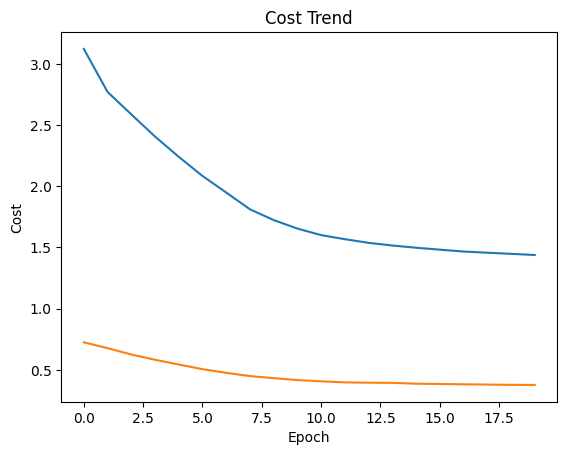

In [123]:
parameters = model(X_train, X_test, Y_train, Y_test)

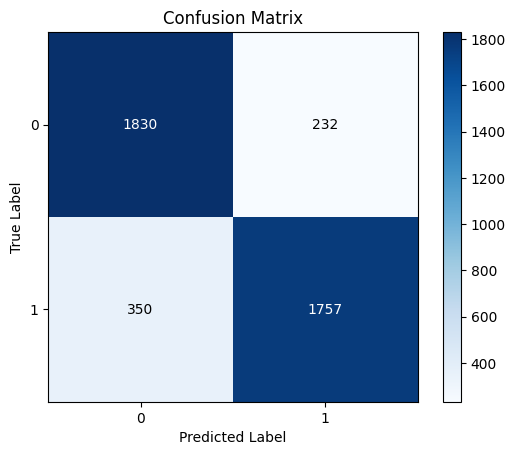

Test Precision: 0.8833584715937657
Test Accuracy: 0.8603981770208683
Test F1 Score: 0.85791015625
Test Recall: 0.8338870431893688


In [124]:
test_predictions = tf.argmax(forward_pass(X_test, parameters).numpy(), axis=0)
test_precision, test_accuracy, test_f1, recall = calculate_metrics(np.argmax(Y_test, axis=0), test_predictions)

print('Test Precision:', test_precision)
print('Test Accuracy:', test_accuracy)
print('Test F1 Score:', test_f1)
print('Test Recall:', recall)